In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import pyarrow.dataset as ds


# disable warnings from pandas
pd.options.mode.chained_assignment = None  # default='warn'

# Load Metadata

In [3]:
portugal_metadata = pd.read_excel('data/PortugalPhotovoltaicDataset/pv_plants_metadata.xlsx')
portugal_metadata.head()

,PV Serial Number,Location,Latitude,Longitude,From date,To date,Installed Power (kWp),Connection Power (kWn)
0,84071567,Lisbon,38.728,-9.138,2019-01-01,2022-12-31,46.00,40.0
1,84071569,Lisbon,38.833,-9.191,2019-01-01,2022-12-31,16.32,15.0
2,84071568,Setubal,38.577,-8.872,2019-01-01,2022-12-31,23.52,20.0
3,84071570,Lisbon,38.725,-9.120,2019-01-01,2022-12-31,30.00,27.0
4,84071566,Faro,37.031,-7.893,2019-01-01,2022-12-31,7.00,6.6


In [39]:
uk_open_climate_fix_metadata = pd.read_csv("data/UKOpenClimateFix/uk_pv_metadata.csv")
uk_open_climate_fix_metadata.head()

,ss_id,latitude_rounded,longitude_rounded,llsoacd,orientation,tilt,kwp,operational_at
0,2405,53.53,-1.63,E01007430,180.0,35.0,3.36,2010-11-18
1,2406,54.88,-1.38,E01008780,315.0,30.0,1.89,2010-12-03
2,2407,54.88,-1.38,E01008780,225.0,30.0,1.89,2010-12-03
3,2408,54.88,-1.38,E01008780,225.0,30.0,1.89,2010-12-03
4,2409,54.88,-1.38,E01008780,225.0,30.0,1.89,2010-12-03


# NOTE:
# The full 'uk_pv_30_minute_data.parquet' dataset is NOT included here due to its large size.
# It can be accessed at: https://huggingface.co/datasets/openclimatefix/uk_pv/tree/main


# Data Import

In [9]:
# Load the data
# load portugal dataset
file_path = 'data/PortugalPhotovoltaicDataset/pv_plants_datasets.xlsx'

# define the correspondence table between sheet names and real names
correspondence = {
    'Lisbon_1': ['84071567'],
    'Lisbon_2': ['84071569'],
    'Lisbon_3': ['84071570'],
    'Lisbon_4': ['62032213'], 
    'Setubal': ['84071568'],
    'Faro': ['84071566'],
    'Braga': ['62030198'],
    'Tavira': ['73060645'],
    'Loule': ['73061935']
}

data_frames = []
for real_name, sheet_names in correspondence.items():
    for sheet_name in sheet_names:
        df = pd.read_excel(file_path, sheet_name=sheet_name)
        df['serial'] = sheet_name
        df['name'] = real_name
        data_frames.append(df)

portugal_df = pd.concat(data_frames, ignore_index=True)
portugal_df.head()
print(len(portugal_df))

315567


In [7]:
import pyarrow.parquet as pq

# Get metadata without fully loading the file
parquet_file = pq.ParquetFile("data/UKOpenClimateFix/uk_pv_30_minute_data.parquet")
num_rows = parquet_file.metadata.num_rows

print(f"Number of rows: {num_rows}")

Number of rows: 2644013376


In [ ]:
# Open Parquet dataset
dataset = ds.dataset("data/UKOpenClimateFix/uk_pv_30_minute_data.parquet", format="parquet")

# Create a filter for the data
filtered_table = dataset.to_table(filter=(ds.field('ss_id').isin([3062, 3800, 7115, 7497, 8712, 9992, 24865, 24964, 26754, 24962, 19064, 23524, 17446, 10618, 24696])))


# Convert to pandas DataFrame (if needed)
uk_open_climate_fix_df = filtered_table.to_pandas()

Number of rows: 2644013376


In [37]:
# Open Parquet dataset
dataset = ds.dataset("data/UKOpenClimateFix/uk_pv_30_minute_data.parquet", format="parquet")

# Create a filter for the data
filtered_table = dataset.to_table(filter=(ds.field('ss_id').isin([3062, 3800, 7115, 7497, 8712, 9992, 24865, 24964, 26754, 24962, 19064, 23524, 17446, 10618, 24696])))


# Convert to pandas DataFrame (if needed)
uk_open_climate_fix_df = filtered_table.to_pandas()

# Explore data

In [6]:
portugal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315567 entries, 0 to 315566
Data columns (total 6 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   Date                       315567 non-null  datetime64[ns]
 1   Produced Energy (kWh)      315567 non-null  float64       
 2   Specific Energy (kWh/kWp)  315567 non-null  float64       
 3   CO2 Avoided (tons)         314677 non-null  object        
 4   serial                     315567 non-null  object        
 5   name                       315567 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(3)
memory usage: 14.4+ MB


In [7]:
portugal_df.describe()

,Date,Produced Energy (kWh),Specific Energy (kWh/kWp)
count,315567,315567.000000,315567.000000
mean,2020-12-31 11:43:51.594557440,5.668671,0.167979
min,2019-01-01 00:00:00,0.000000,0.000000
25%,2020-01-01 05:00:00,0.000000,0.000000
50%,2020-12-31 11:00:00,0.000000,0.000000
75%,2021-12-31 17:00:00,7.250000,0.300000
max,2022-12-31 23:00:00,56.000000,0.920000
std,NaN,9.856366,0.248819


In [8]:
portugal_df.isna().sum()

Date                           0
Produced Energy (kWh)          0
Specific Energy (kWh/kWp)      0
CO2 Avoided (tons)           890
serial                         0
name                           0
dtype: int64

## UK Open Climate Fix

In [9]:
uk_open_climate_fix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1550928 entries, 0 to 1550927
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   generation_wh  1550924 non-null  float64       
 1   datetime       1550928 non-null  datetime64[us]
 2   ss_id          1550928 non-null  int64         
dtypes: datetime64[us](1), float64(1), int64(1)
memory usage: 35.5 MB


In [10]:
uk_open_climate_fix_df.describe()

,generation_wh,datetime,ss_id
count,1.550924e+06,1550928,1.550928e+06
mean,3.351118e+03,2017-09-25 20:27:14.071988,1.103960e+04
min,0.000000e+00,2011-11-02 00:00:00,3.062000e+03
25%,0.000000e+00,2015-10-23 07:00:00,6.564000e+03
50%,0.000000e+00,2017-12-10 11:45:00,7.497000e+03
75%,1.499800e+03,2019-11-08 13:30:00,1.906400e+04
max,9.012000e+04,2021-09-30 23:30:00,2.675400e+04
std,8.722442e+03,NaN,7.950555e+03


In [38]:
uk_open_climate_fix_df.isna().sum()

generation_wh    4
datetime         0
ss_id            0
dtype: int64

# Stations Location

In [40]:
max_marker_size = 50  # Define the maximum size for the markers
scale_factor = 0.2  # Define the scale factor for the marker sizes

fig = go.Figure()

# Add Portugal dataset as the second trace
fig.add_trace(
    go.Scattermapbox(
        lat=portugal_metadata["Latitude"],
        lon=portugal_metadata["Longitude"],
        mode='markers',
        marker=dict(
            size=portugal_metadata["Installed Power (kWp)"] * scale_factor,
            sizemin=2,  # Minimum size of markers
            sizeref=max_marker_size / (portugal_metadata["Installed Power (kWp)"].max() * scale_factor),
            color='fuchsia'
        ),
        text=portugal_metadata["PV Serial Number"],
        hoverinfo='text',
        customdata=portugal_metadata[["Installed Power (kWp)", "Location"]],
        hovertemplate="<b>%{text}</b><br>Installed Power: %{customdata[0]} kWp<br>Location: %{customdata[1]}"
    )
)

# Add the UK Open Climate Fix dataset as the third trace
fig.add_trace(
    go.Scattermapbox(
        lat=uk_open_climate_fix_metadata["latitude_rounded"],
        lon=uk_open_climate_fix_metadata["longitude_rounded"],
        mode='markers',
        marker=dict(
            size=uk_open_climate_fix_metadata["kwp"] * scale_factor,
            sizemin=2,  # Minimum size of markers
            sizeref=max_marker_size / (uk_open_climate_fix_metadata["kwp"].max() * scale_factor),
            color='green'
        ),
        text=uk_open_climate_fix_metadata["ss_id"],
        hoverinfo='text',
        customdata=uk_open_climate_fix_metadata["kwp"],
        hovertemplate="<b>%{text}</b><br>Capacity: %{customdata} kW"
    )
)

# Set up the Mapbox layout and style
fig.update_layout(
    mapbox=dict(
        style="open-street-map",
        zoom=5,
        center=dict(lat=51, lon=-0.5)
    ),

    margin={"r": 0, "t": 0, "l": 0, "b": 0}
)

fig.show()

In [28]:
print(set(uk_open_climate_fix_metadata["ss_id"]))

{24865, 24962, 26721, 6564, 23524, 17446, 24964, 8712, 19064, 10618, 24696}


# Single Station Power Production

In [41]:
def plot_station_availability(selected_data, ss_id, ss_id_col='ss_id', datetime_col='datetime', energy_production_col='energy_production', start_date=None, end_date=None):
    """
    Function to plot scatter plot of energy production for a selected station
    and 14-day rolling average of energy production.

    Parameters:
    selected_data: pd.DataFrame - DataFrame containing columns ['ss_id', 'datetime', 'energy_availability']
    ss_id: int or str - ID of the station to filter by 'ss_id'
    """
    # Filter the data for the specific station
    if start_date and end_date:
        station_data = selected_data[(selected_data[ss_id_col] == ss_id) & (selected_data[datetime_col] >= start_date) & (selected_data[datetime_col] <= end_date)].copy()
    else:
        station_data = selected_data[selected_data[ss_id_col] == ss_id].copy()
    
    if station_data.empty:
        print(f"No data found for station ID: {ss_id}")
        return

    # Ensure datetime is sorted for proper rolling average
    station_data = station_data.sort_values(by=datetime_col)
    
    # Calculate the 14-day rolling average of energy availability
    station_data['rolling_avg_14d'] = station_data[energy_production_col].rolling(window=14*24, min_periods=1).mean()
    
    # Set the datetime column as index for resampling
    station_data.set_index(datetime_col, inplace=False)
    daily_energy = station_data.resample('D', on=datetime_col)[energy_production_col].sum().reset_index()
    station_data.reset_index(drop=True, inplace=True)
    print(daily_energy.head())

    # --- Plot 1: Scatter Plot of production ---
    plt.figure(figsize=(10, 6))
    plt.scatter(daily_energy[datetime_col], daily_energy[energy_production_col], alpha=0.7, label='Energy Production', color='dodgerblue')
    plt.title(f'Energy Production - Station {ss_id}')
    plt.xlabel('Date')
    plt.ylabel('Energy Production')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Plot 2: 14-Day Rolling Average ---
    plt.figure(figsize=(10, 6))
    plt.plot(station_data[datetime_col], station_data['rolling_avg_14d'], label='14-Day Rolling Average', color='green', linewidth=2)
    plt.title(f'14-Day Rolling Average of Energy Production - Station {ss_id}')
    plt.xlabel('Date')
    plt.ylabel('Energy Production')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    datetime  generation_wh
0 2011-11-02        5997.47
1 2011-11-03        3182.20
2 2011-11-04        5122.00
3 2011-11-05        6571.71
4 2011-11-06       11617.31


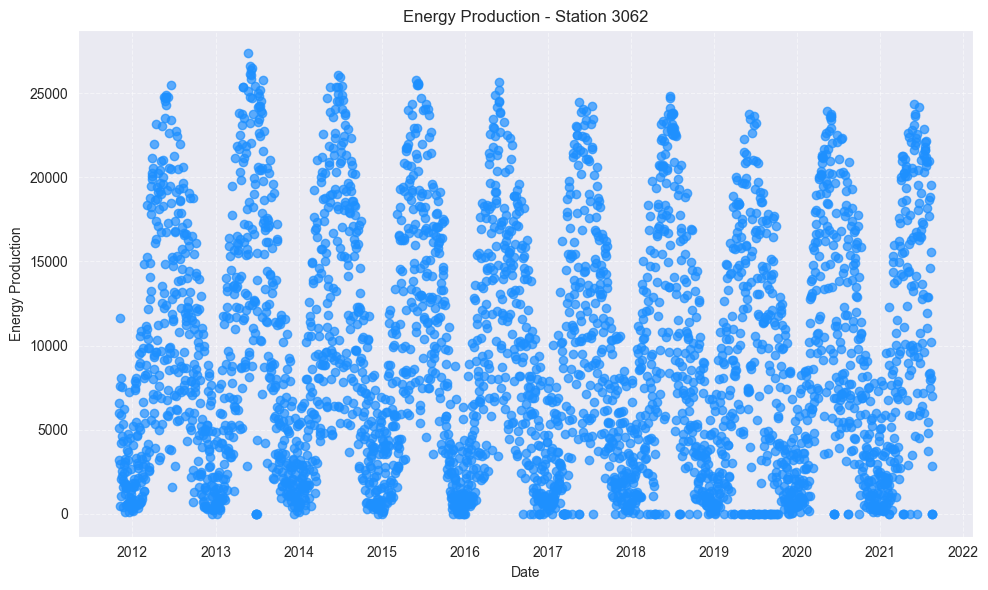

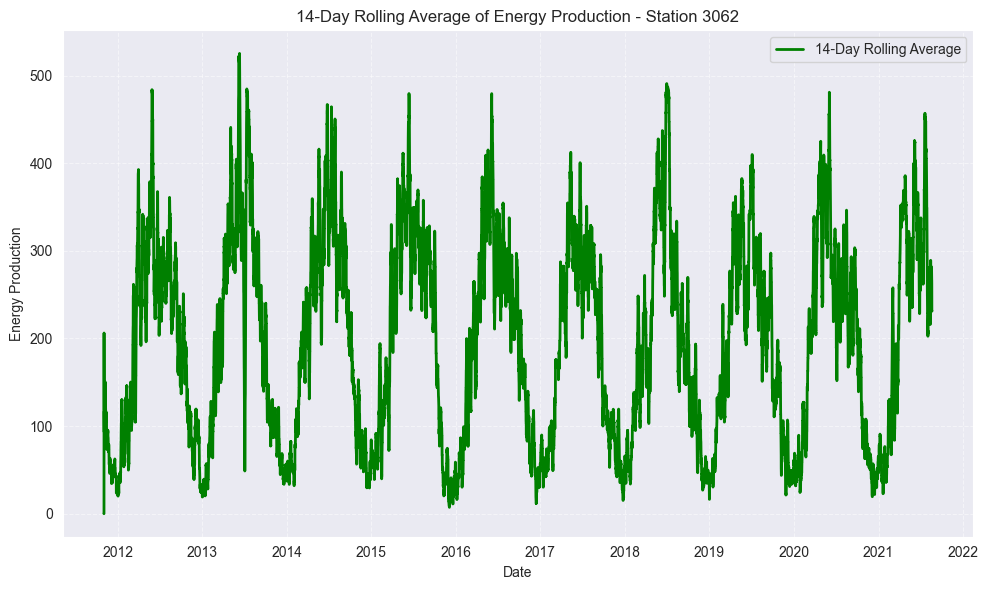

    datetime  generation_wh
0 2012-01-18       11879.32
1 2012-01-19       43035.59
2 2012-01-20       11459.68
3 2012-01-21       23984.27
4 2012-01-22       43566.36


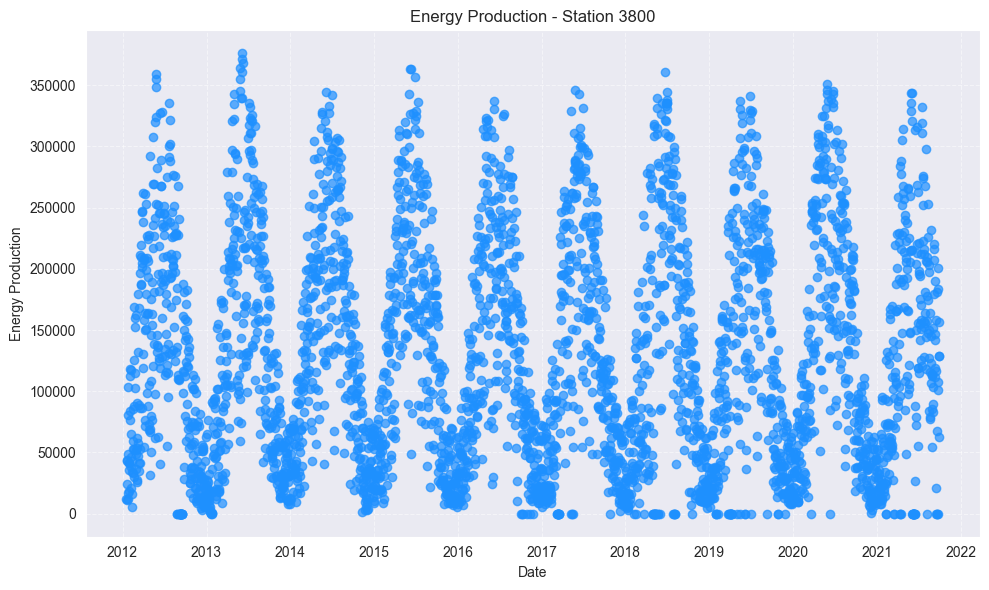

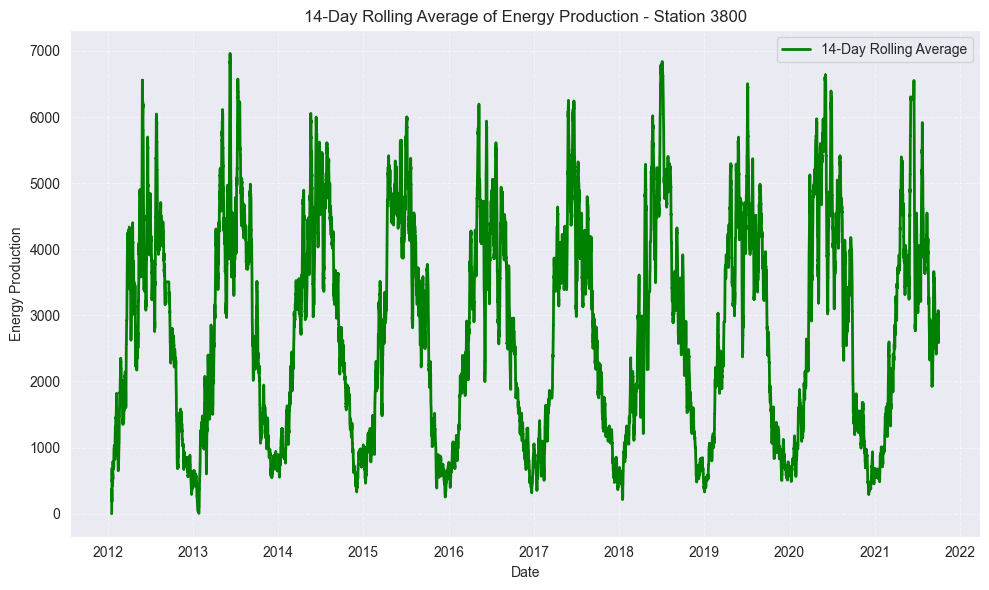

    datetime  generation_wh
0 2012-11-09       26552.68
1 2012-11-10       48077.40
2 2012-11-11      184713.46
3 2012-11-12       36737.72
4 2012-11-13       55875.23


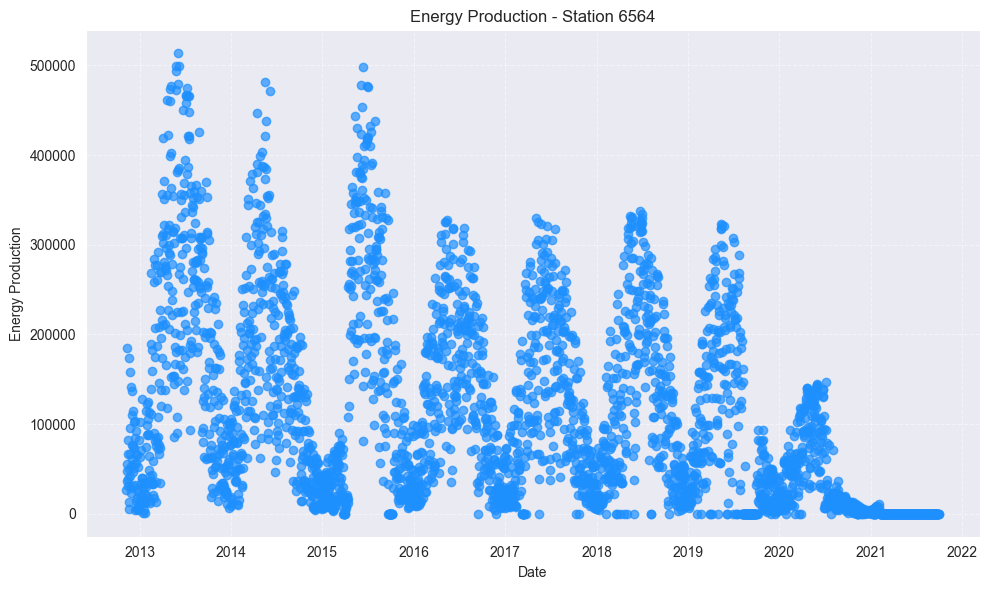

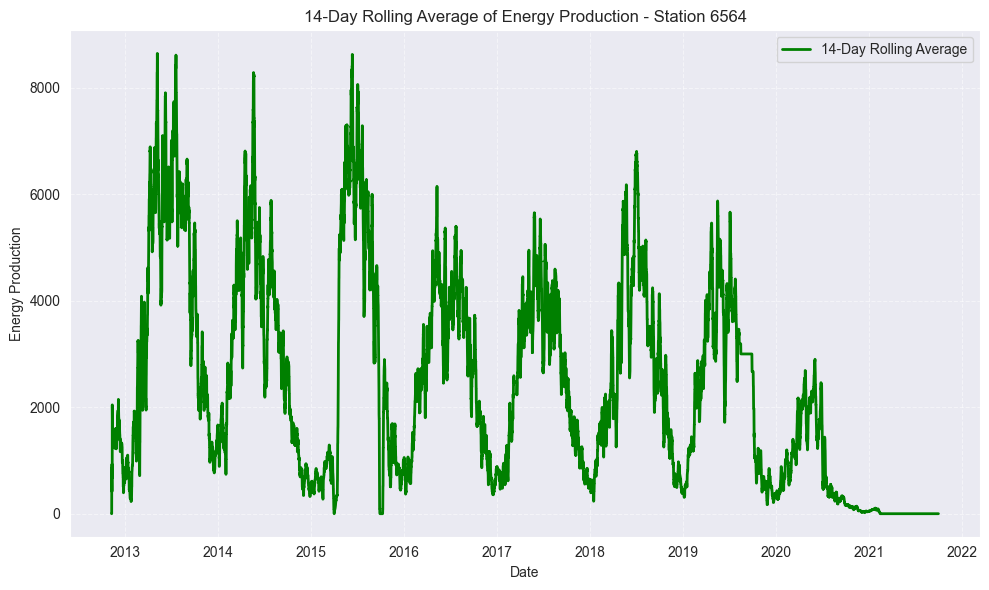

    datetime  generation_wh
0 2013-03-17            0.0
1 2013-03-18            0.0
2 2013-03-19            0.0
3 2013-03-20            0.0
4 2013-03-21            0.0


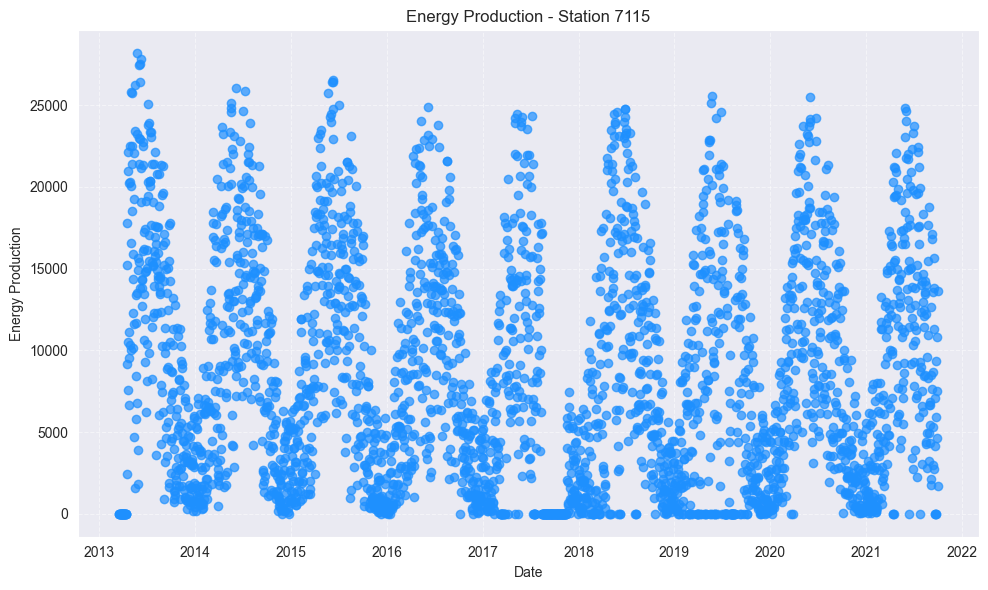

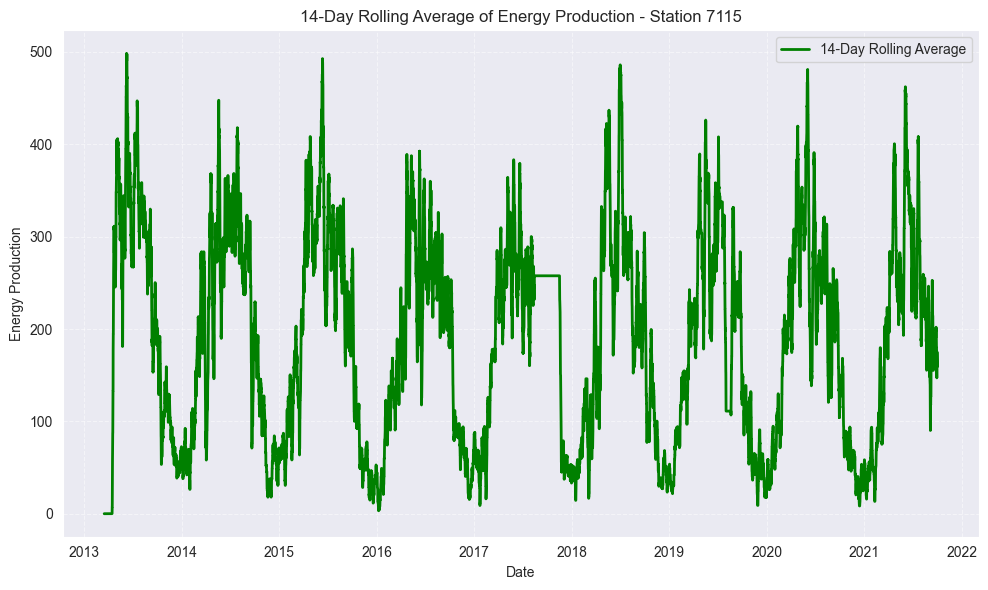

    datetime  generation_wh
0 2013-03-13      254313.06
1 2013-03-14      242761.47
2 2013-03-15       79531.50
3 2013-03-16      109050.42
4 2013-03-17      171194.10


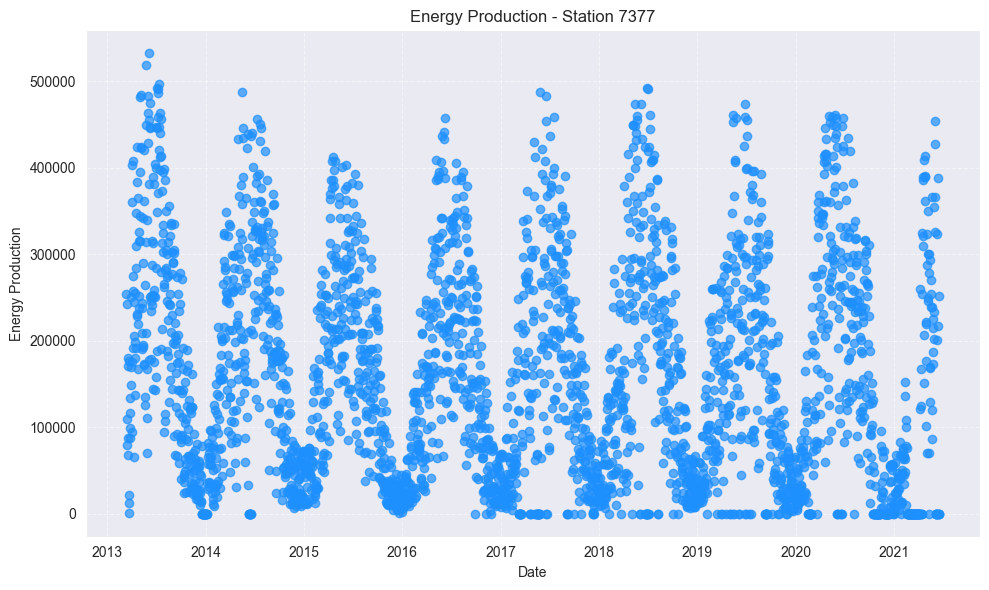

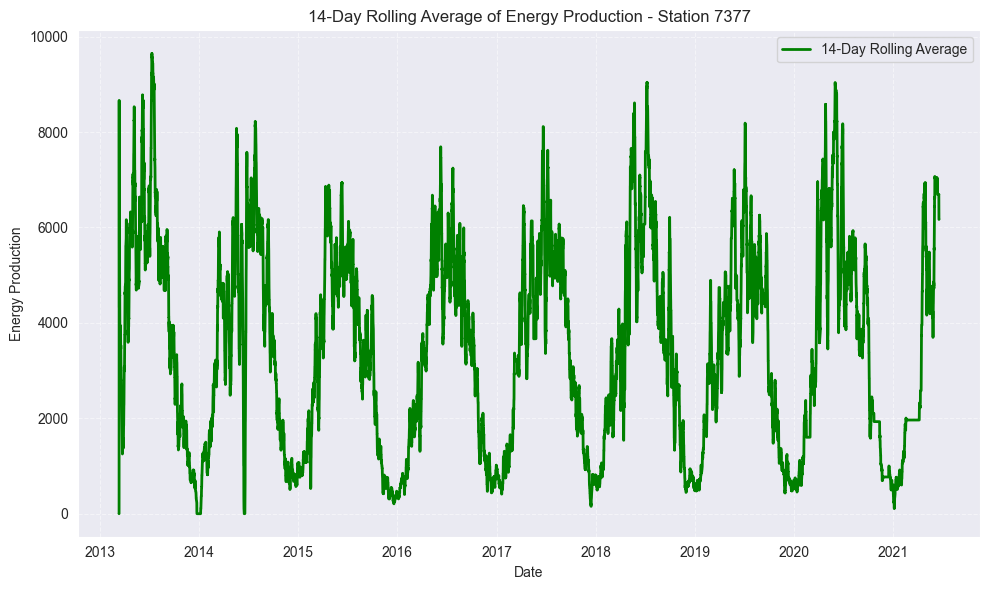

    datetime  generation_wh
0 2013-04-09            0.0
1 2013-04-10            0.0
2 2013-04-11            0.0
3 2013-04-12            0.0
4 2013-04-13            0.0


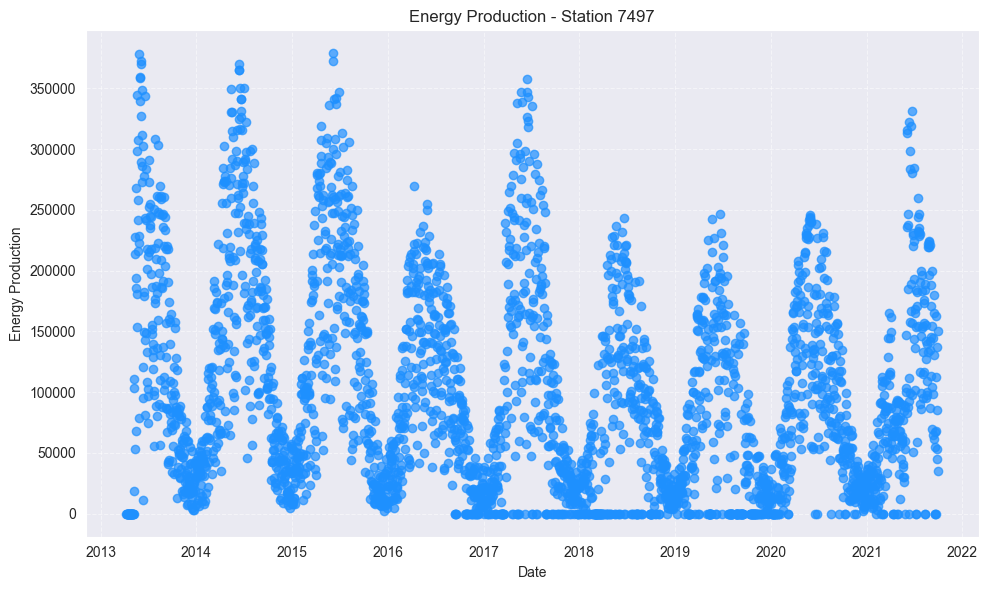

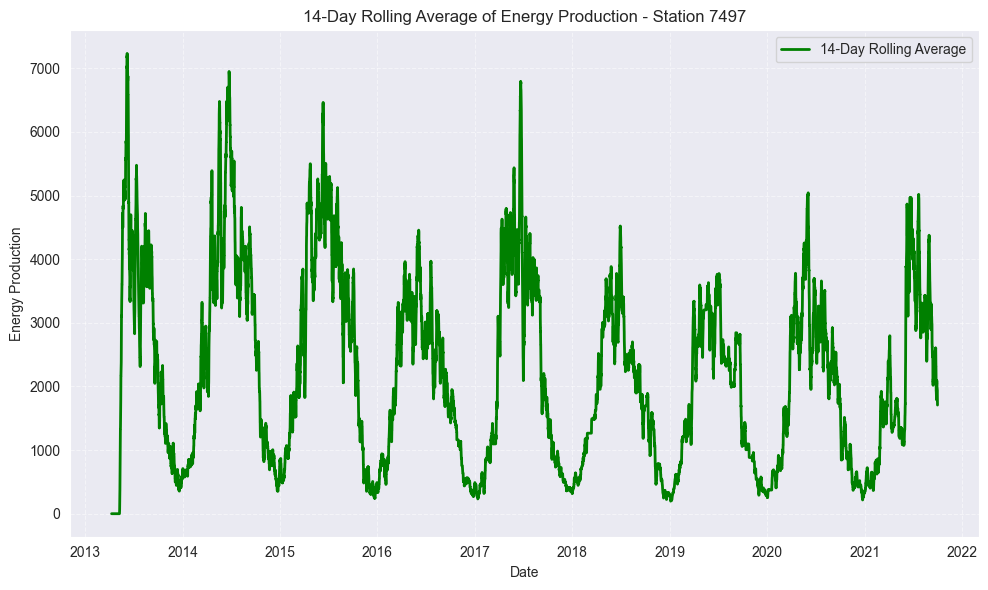

    datetime  generation_wh
0 2013-12-04      202079.60
1 2013-12-05       70287.52
2 2013-12-06      122756.56
3 2013-12-07      188033.36
4 2013-12-08      125512.16


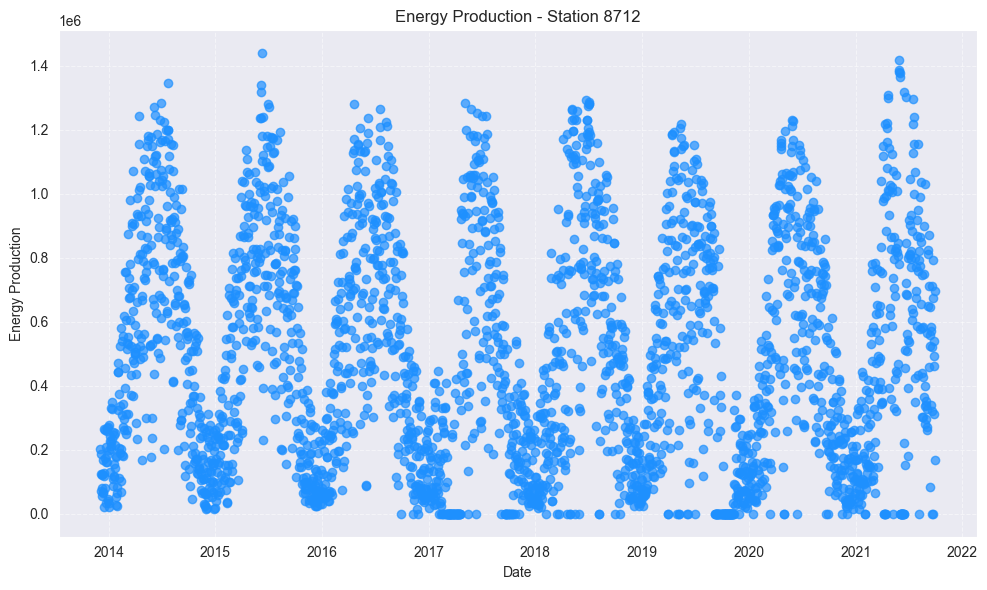

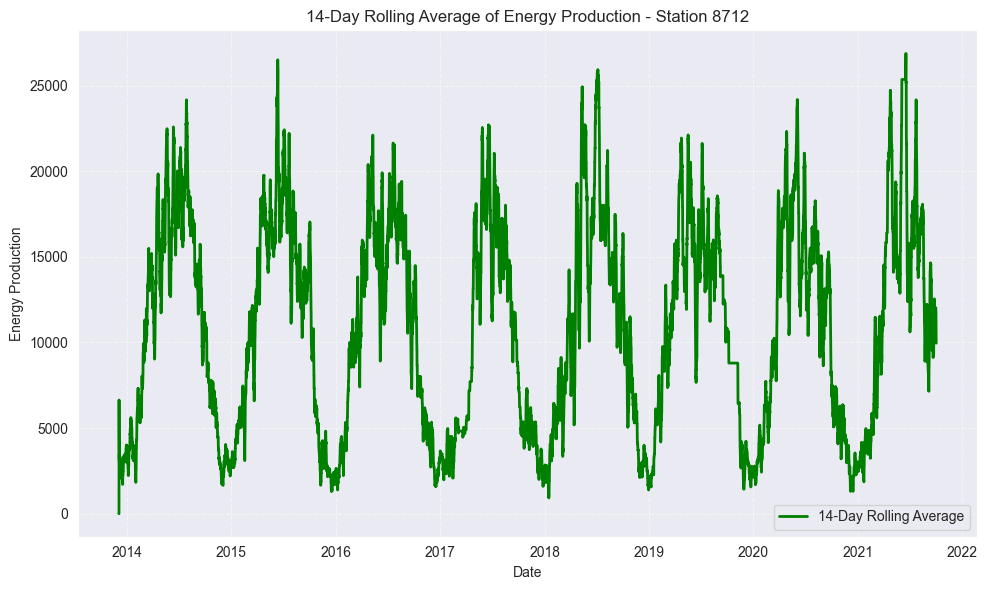

    datetime  generation_wh
0 2014-01-30          534.0
1 2014-01-31          519.0
2 2014-02-01         5810.0
3 2014-02-02         9299.0
4 2014-02-03         1642.0


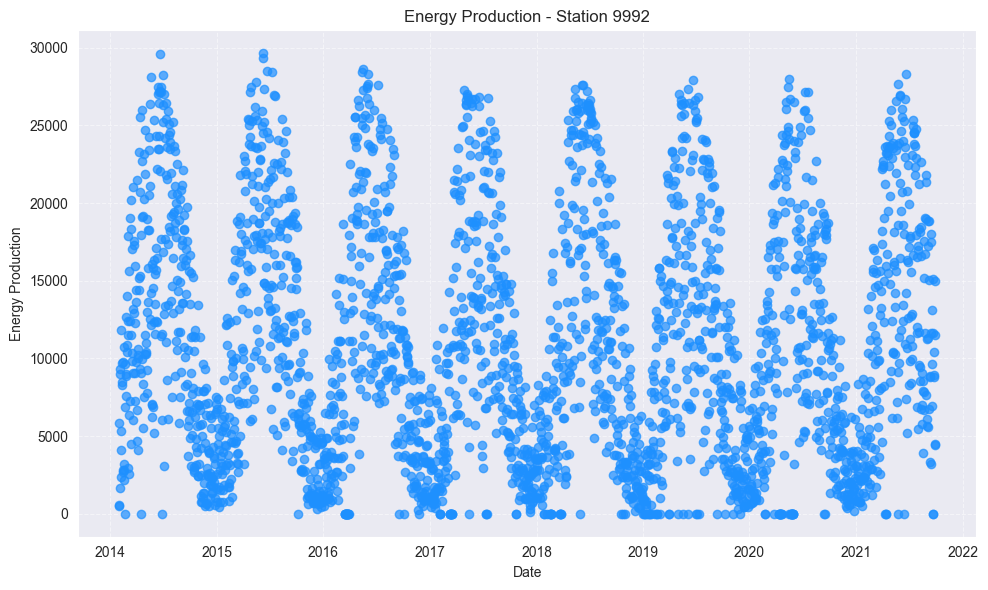

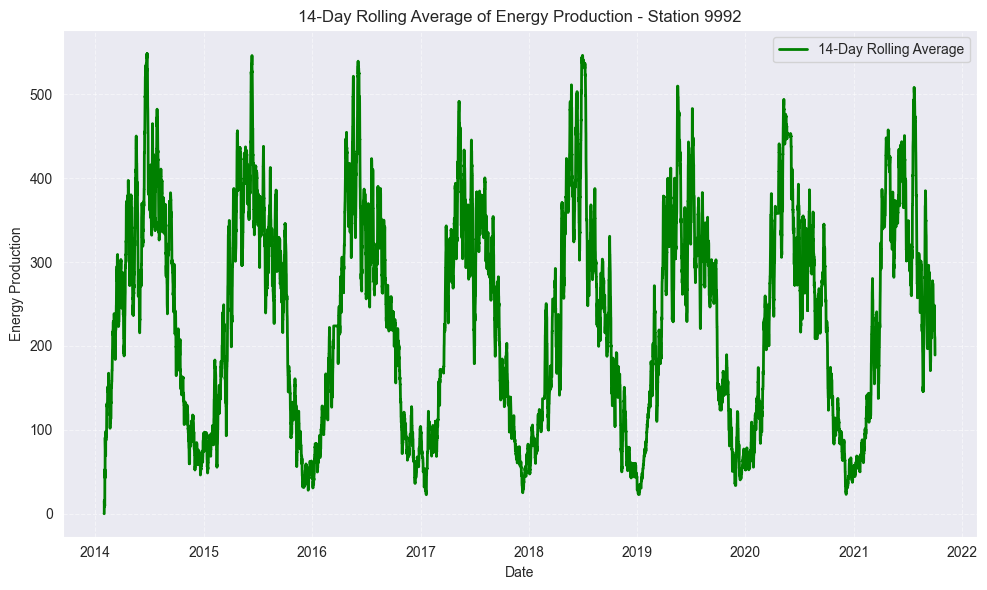

    datetime  generation_wh
0 2014-06-24      294116.96
1 2014-06-25      337312.98
2 2014-06-26      297537.16
3 2014-06-27      206519.75
4 2014-06-28      175313.19


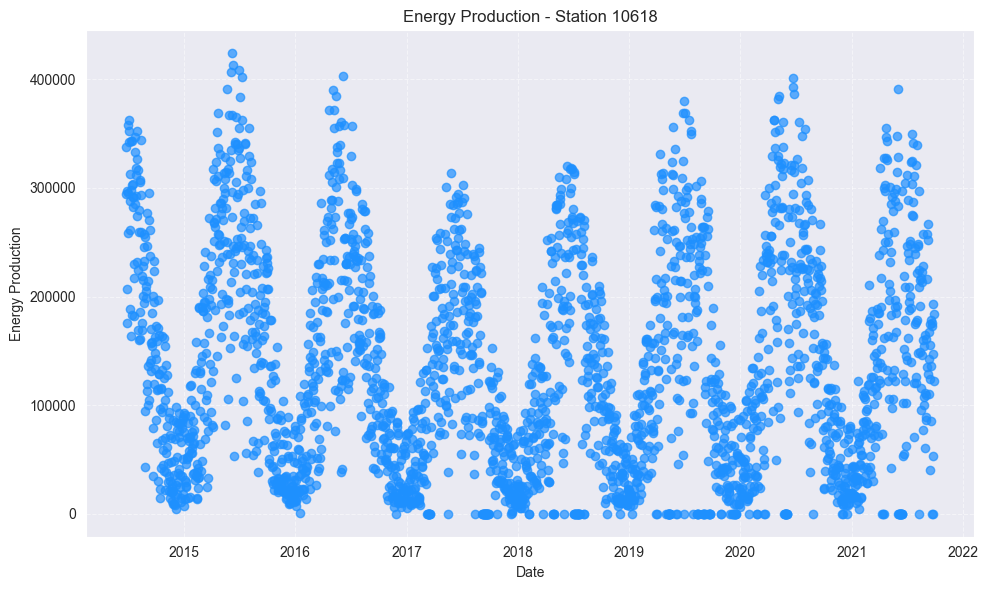

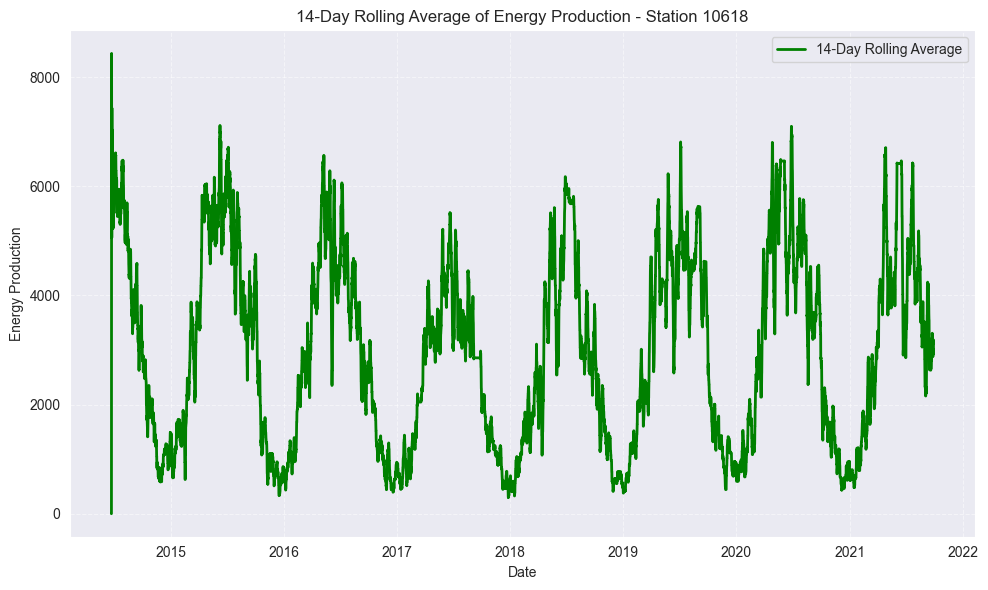

    datetime  generation_wh
0 2015-06-09      254606.58
1 2015-06-10      364237.93
2 2015-06-11      351332.47
3 2015-06-12       95890.00
4 2015-06-13      249904.82


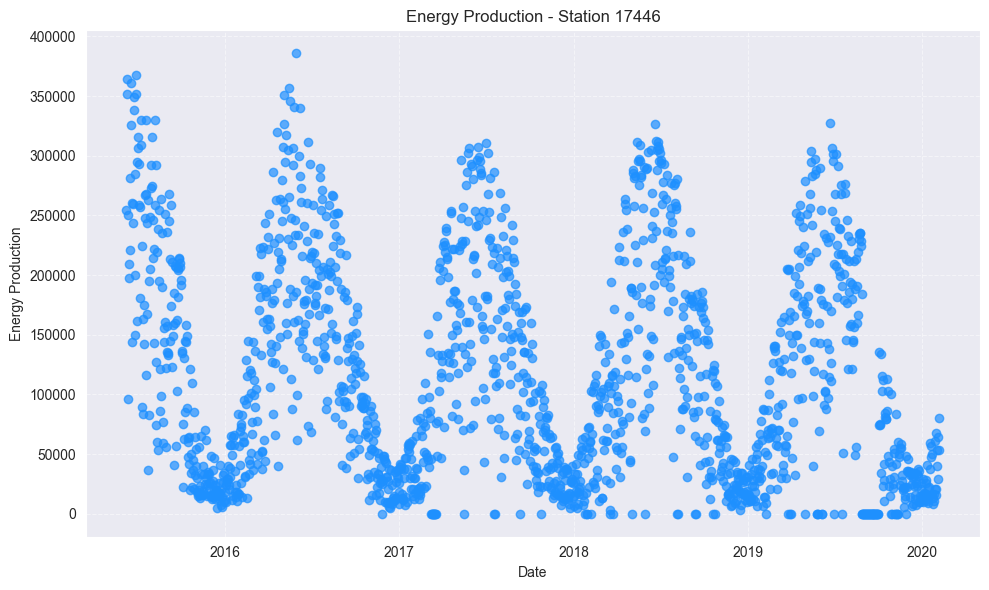

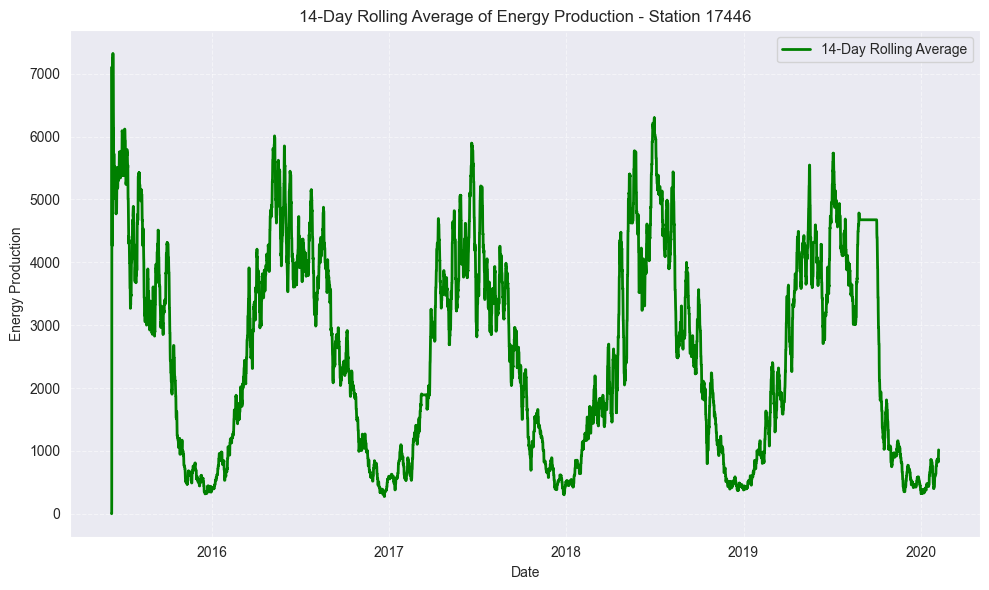

    datetime  generation_wh
0 2015-09-10      586312.68
1 2015-09-11      543083.08
2 2015-09-12      336455.32
3 2015-09-13      268967.88
4 2015-09-14      316876.56


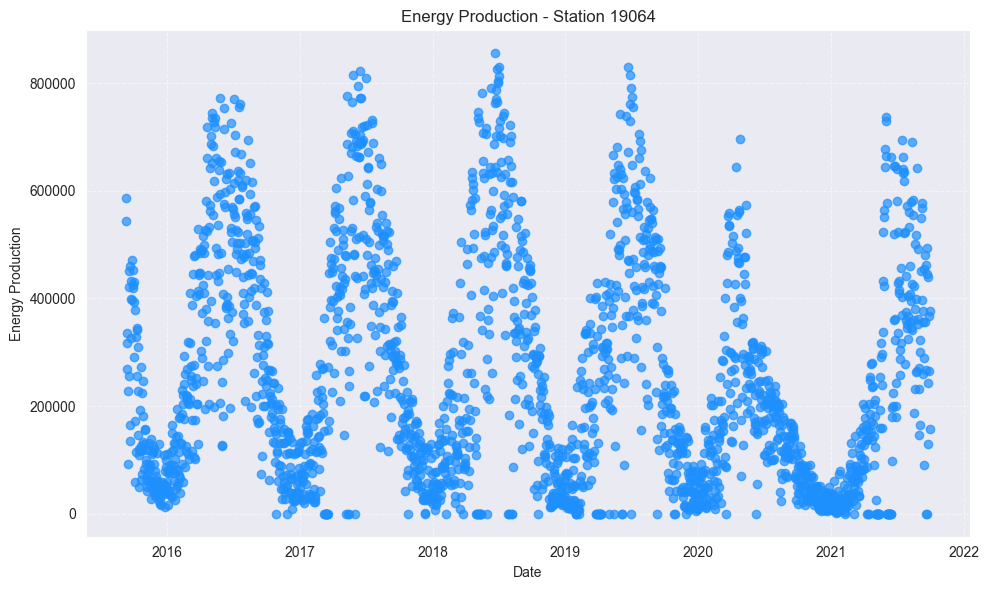

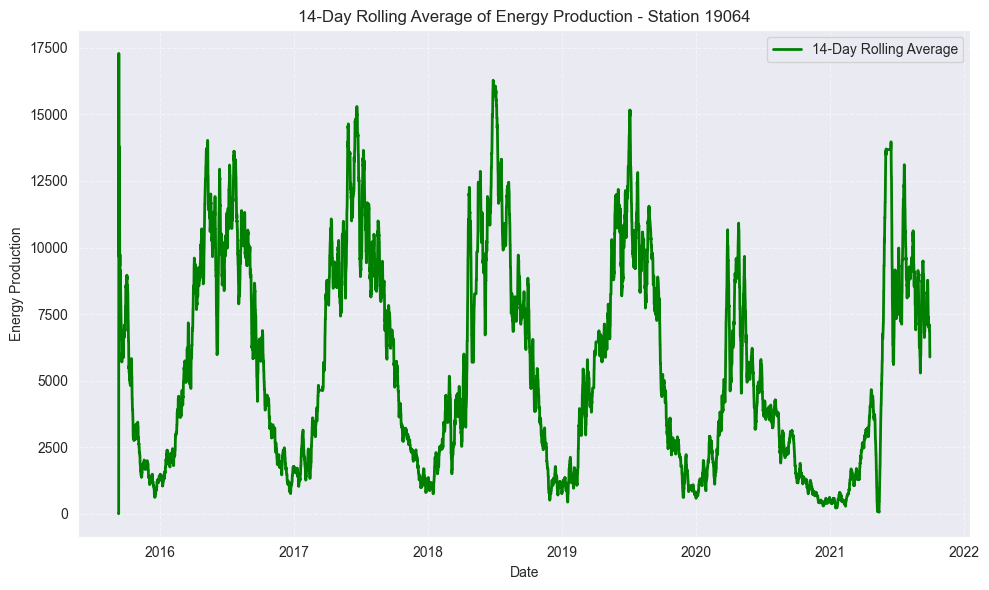

    datetime  generation_wh
0 2016-11-17       69021.12
1 2016-11-18      119697.72
2 2016-11-19      148732.20
3 2016-11-20       29263.20
4 2016-11-21       41158.62


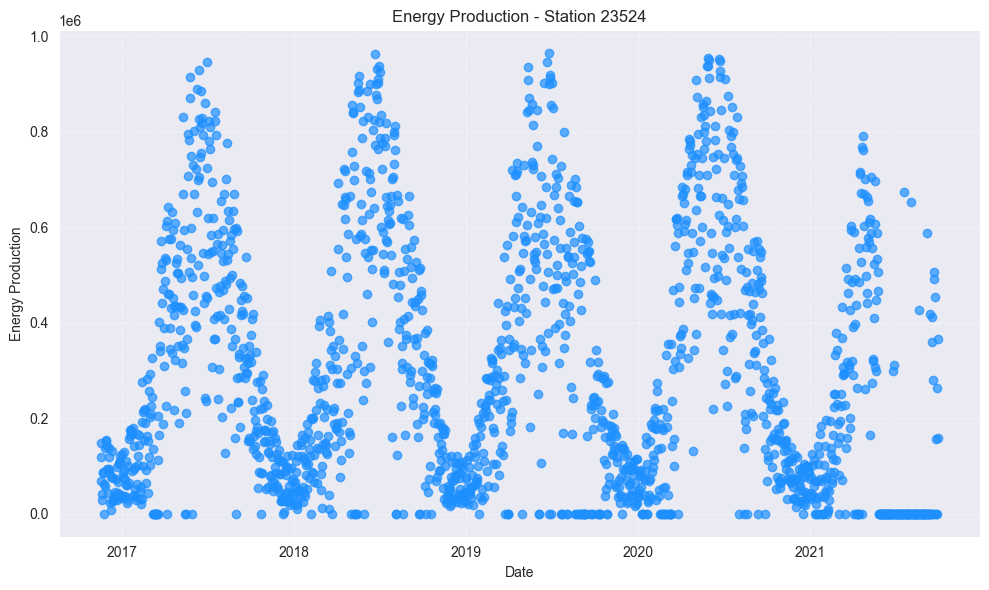

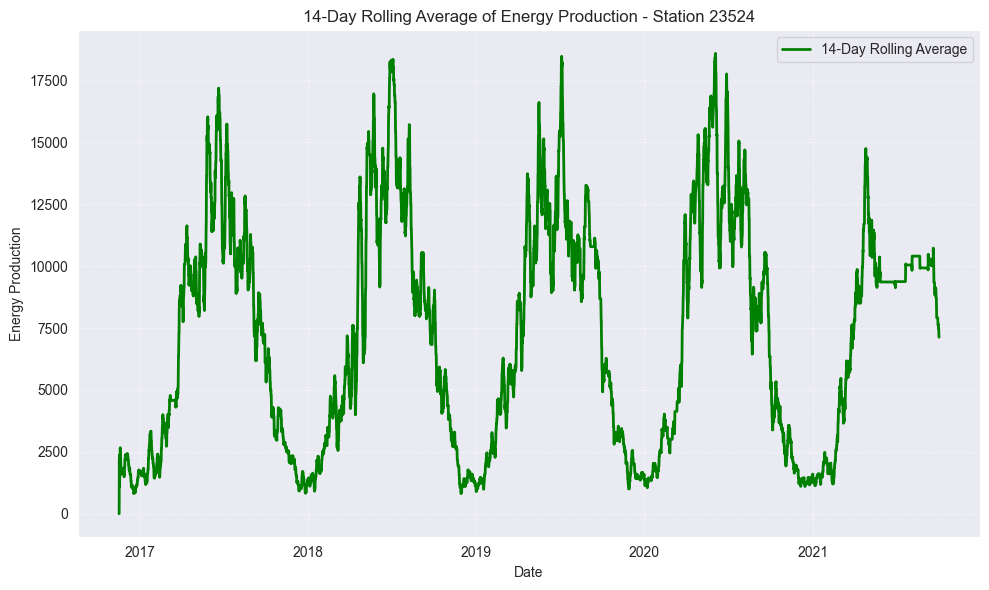

    datetime  generation_wh
0 2016-11-17       53664.28
1 2016-11-18       42496.00
2 2016-11-19       71633.92
3 2016-11-20       14450.96
4 2016-11-21        2909.00


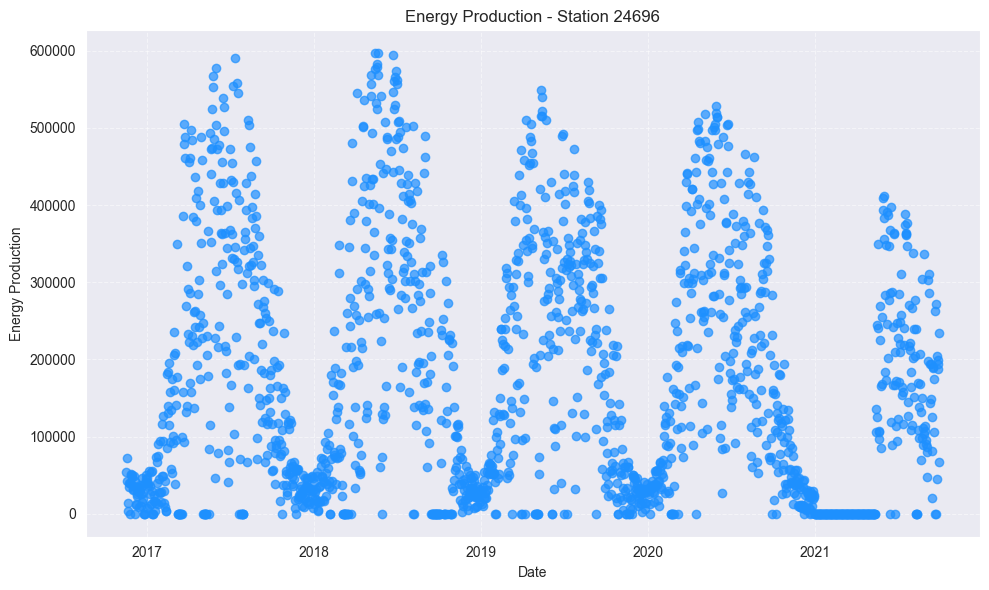

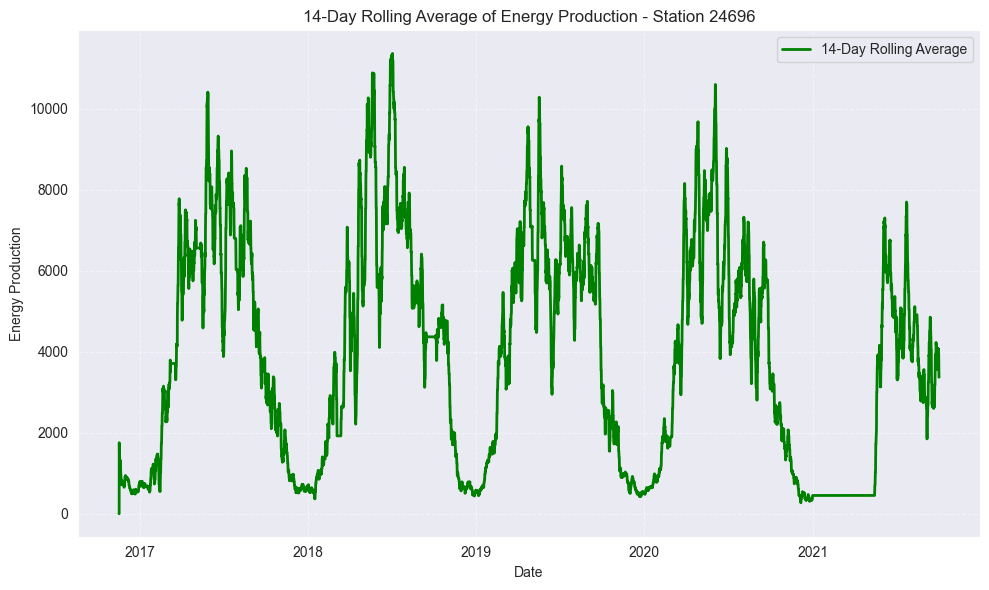

    datetime  generation_wh
0 2016-11-17      124795.92
1 2016-11-18      222392.16
2 2016-11-19      312704.88
3 2016-11-20       71710.56
4 2016-11-21       83869.12


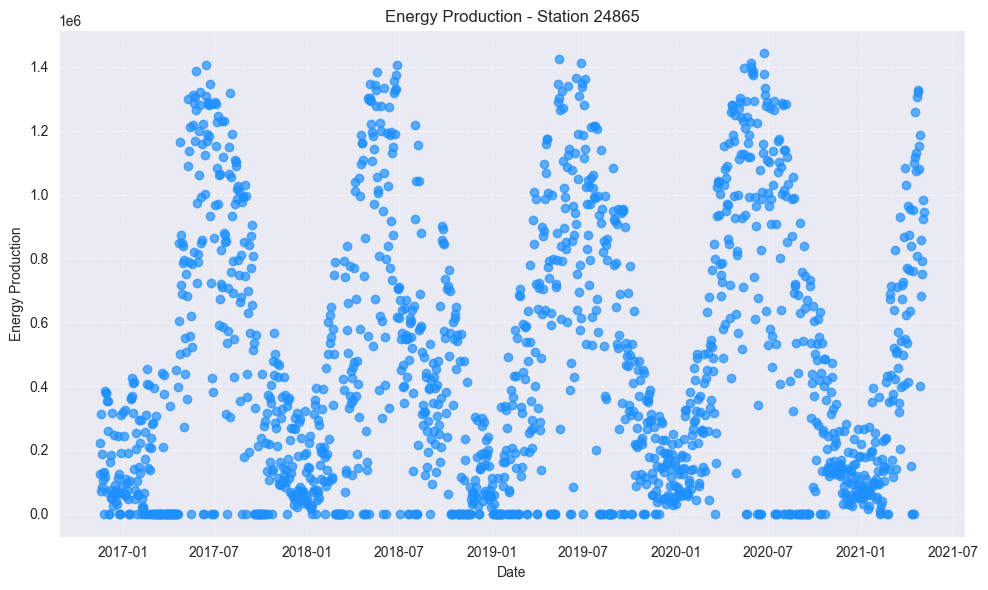

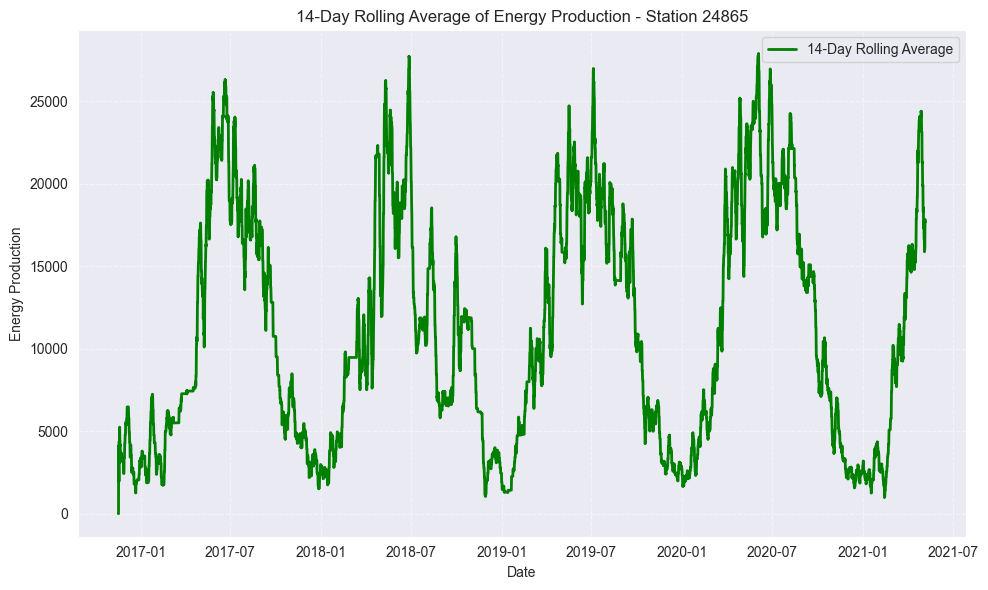

    datetime  generation_wh
0 2016-11-17      102906.40
1 2016-11-18      100702.80
2 2016-11-19      185717.96
3 2016-11-20       62350.16
4 2016-11-21       36445.44


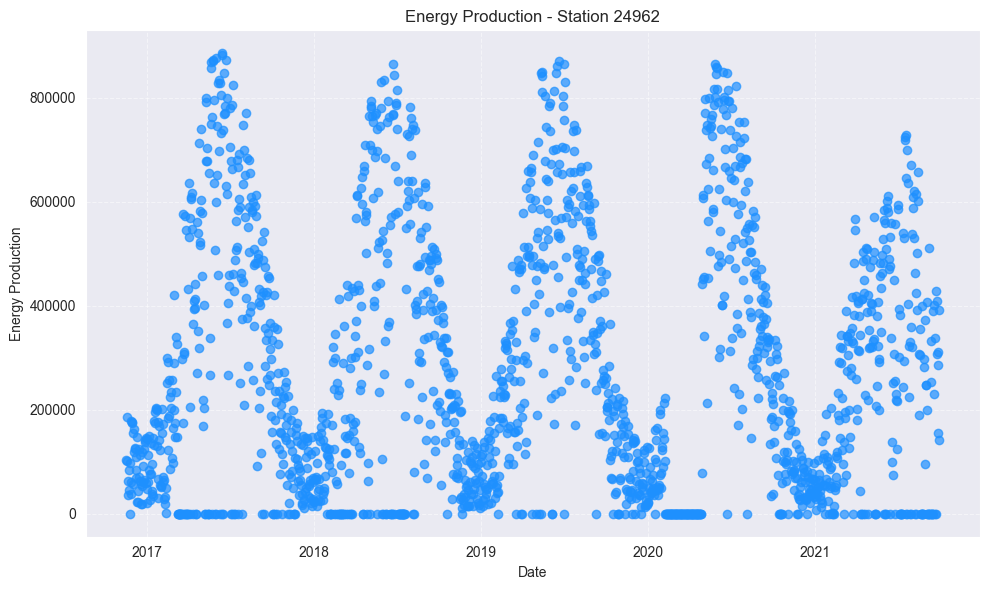

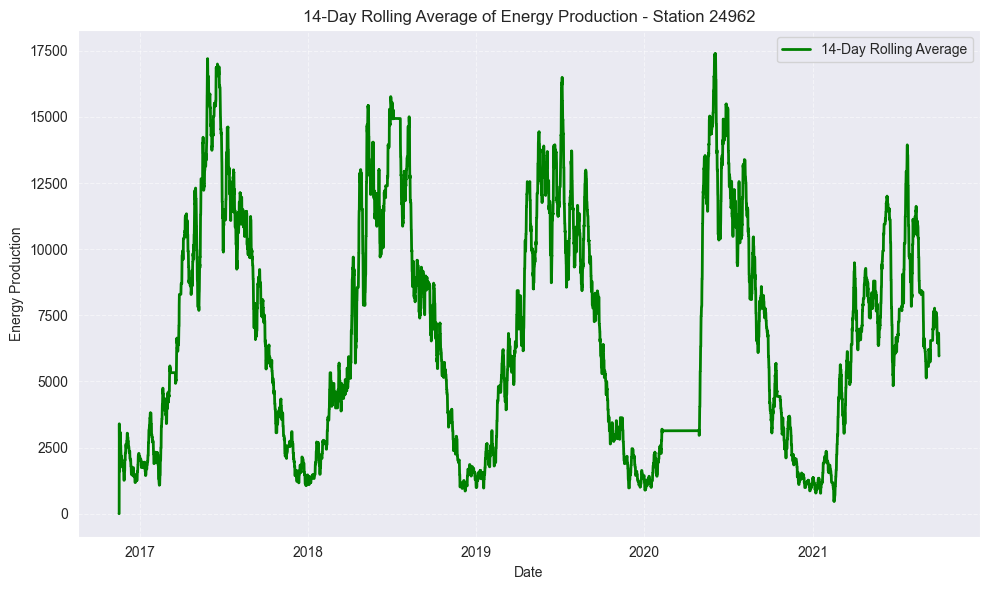

    datetime  generation_wh
0 2016-11-18       73153.16
1 2016-11-19      108687.64
2 2016-11-20       16406.80
3 2016-11-21       20495.32
4 2016-11-22       88887.88


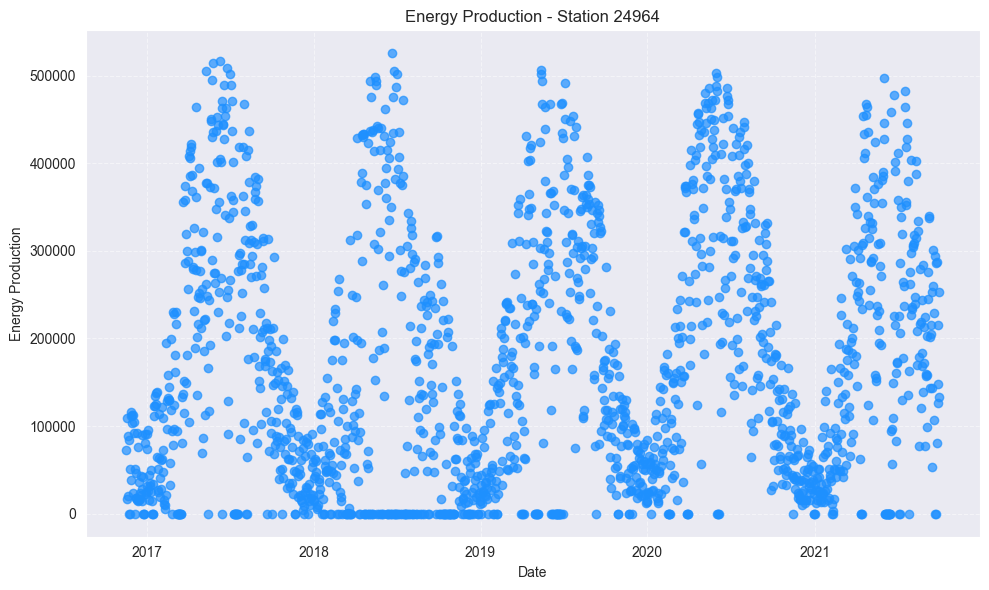

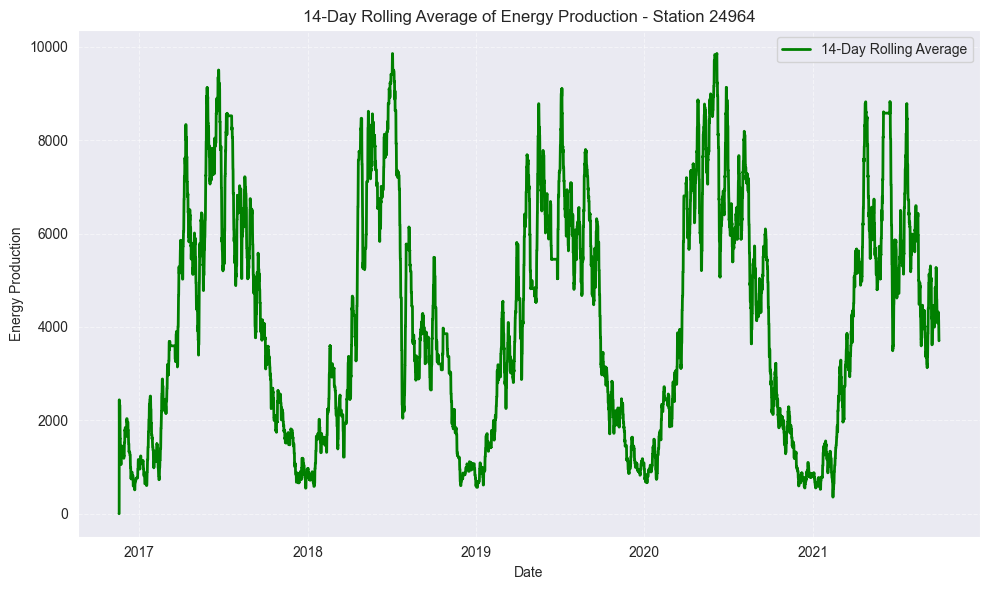

    datetime  generation_wh
0 2016-11-17       36937.54
1 2016-11-18       40397.25
2 2016-11-19       82351.10
3 2016-11-20       20574.21
4 2016-11-21       16799.89


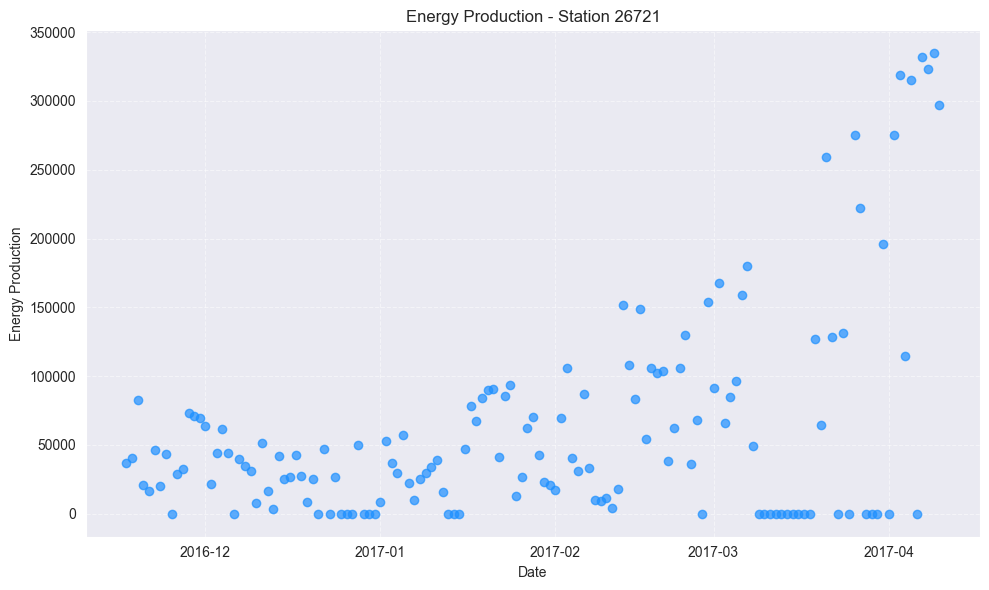

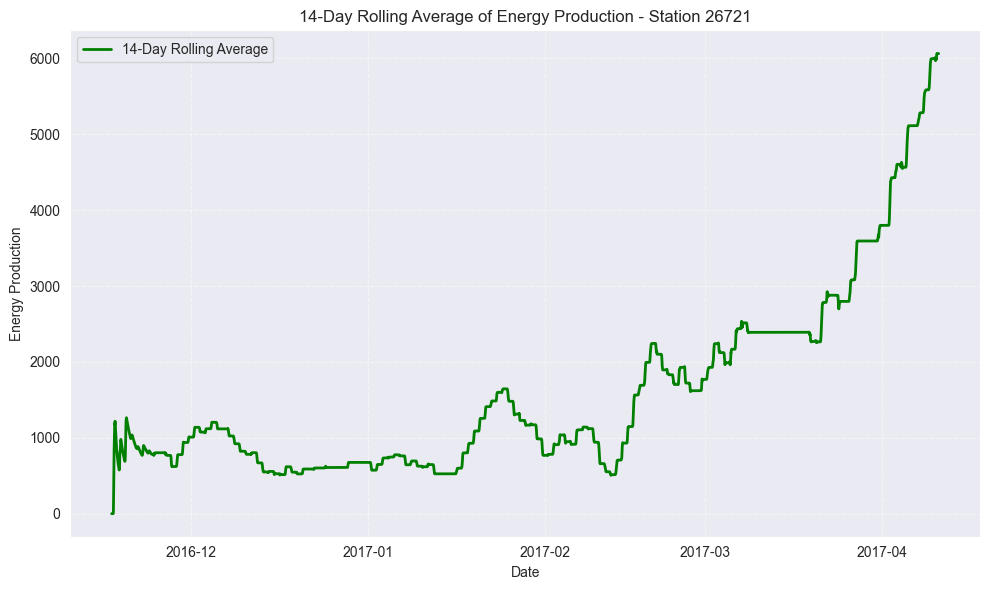

    datetime  generation_wh
0 2016-11-17         1299.0
1 2016-11-18         2738.0
2 2016-11-19         2041.0
3 2016-11-20          710.0
4 2016-11-21          283.0


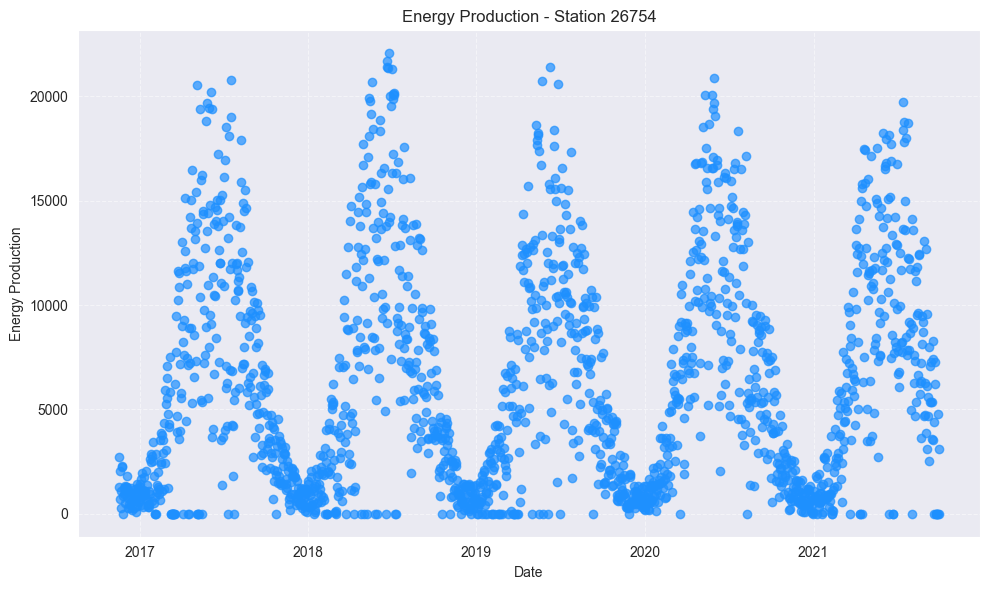

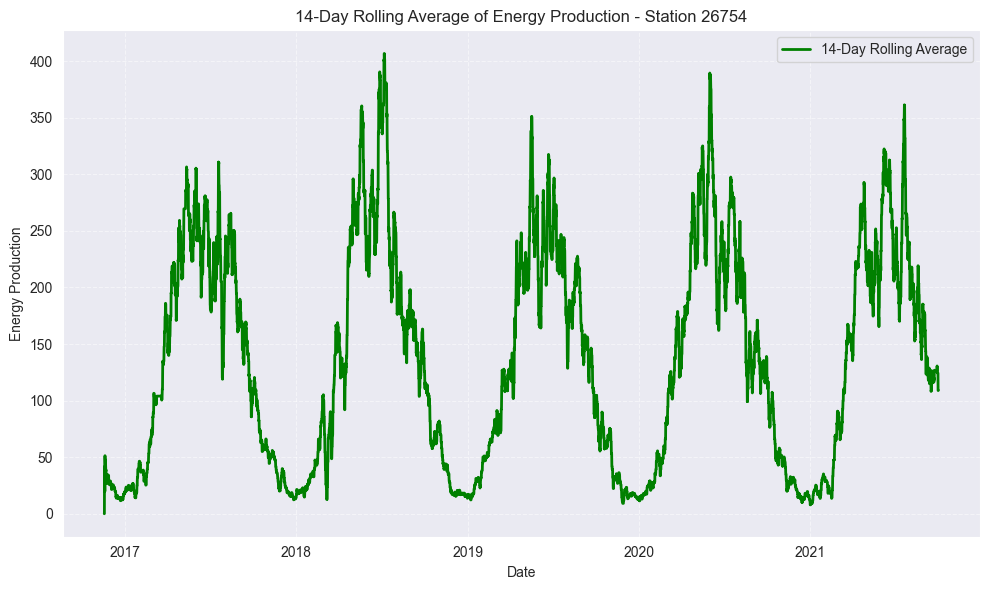

In [42]:
uk_open_climate_fix_df["datetime"] = pd.to_datetime(uk_open_climate_fix_df["datetime"])
uk_open_climate_fix_df["ss_id"] = uk_open_climate_fix_df["ss_id"].astype(str)
uk_open_climate_fix_metadata["ss_id"] = uk_open_climate_fix_metadata["ss_id"].astype(str)

uk_open_climate_fix_metadata_selected = uk_open_climate_fix_metadata[uk_open_climate_fix_metadata["ss_id"].isin(uk_open_climate_fix_df["ss_id"].unique())]

for _, row in uk_open_climate_fix_metadata_selected.iterrows():
    plot_station_availability(uk_open_climate_fix_df, row["ss_id"], ss_id_col='ss_id', datetime_col='datetime', energy_production_col='generation_wh', start_date='2010-01-01', end_date='2022-12-31') 

        Date  Produced Energy (kWh)
0 2019-01-01                 122.75
1 2019-01-02                 126.25
2 2019-01-03                 117.25
3 2019-01-04                  67.25
4 2019-01-05                 125.75


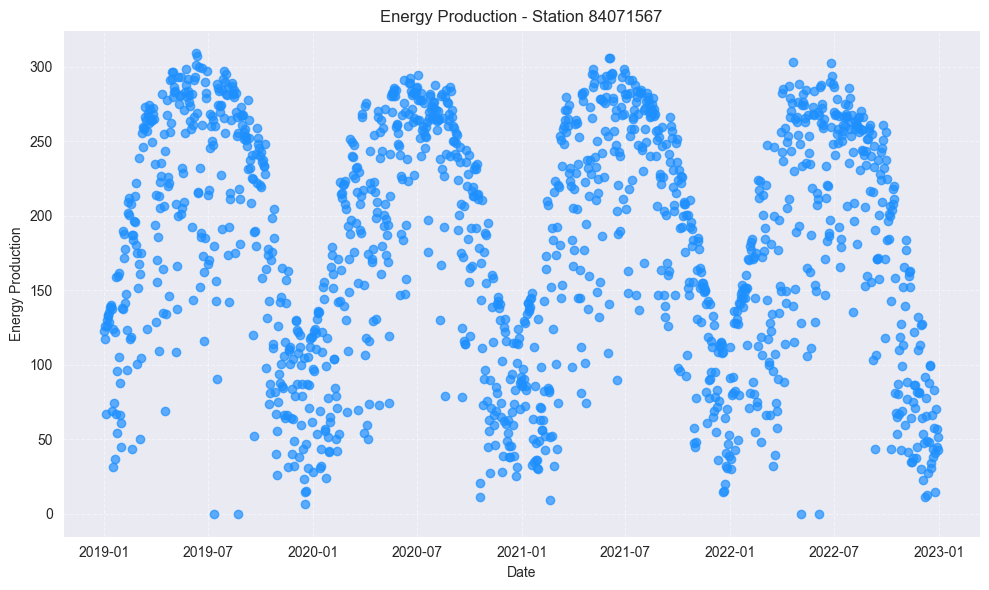

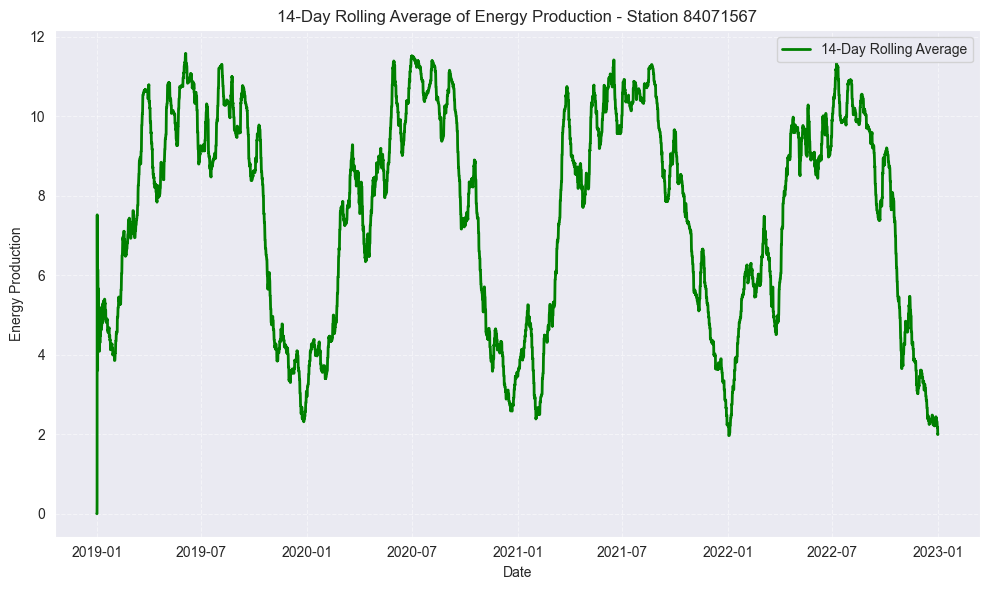

        Date  Produced Energy (kWh)
0 2019-01-01                  46.25
1 2019-01-02                  47.00
2 2019-01-03                  24.00
3 2019-01-04                  45.50
4 2019-01-05                  47.50


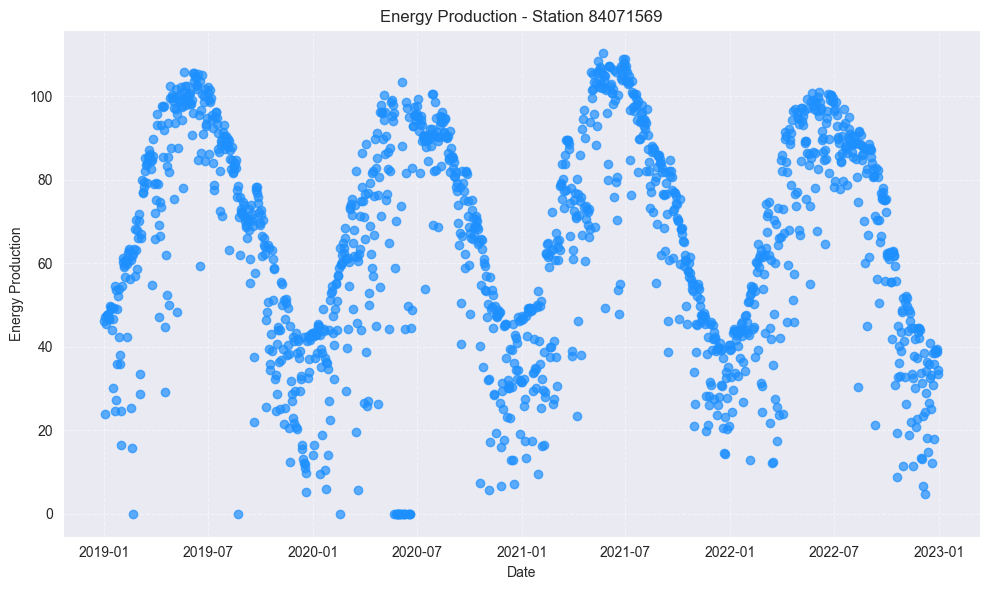

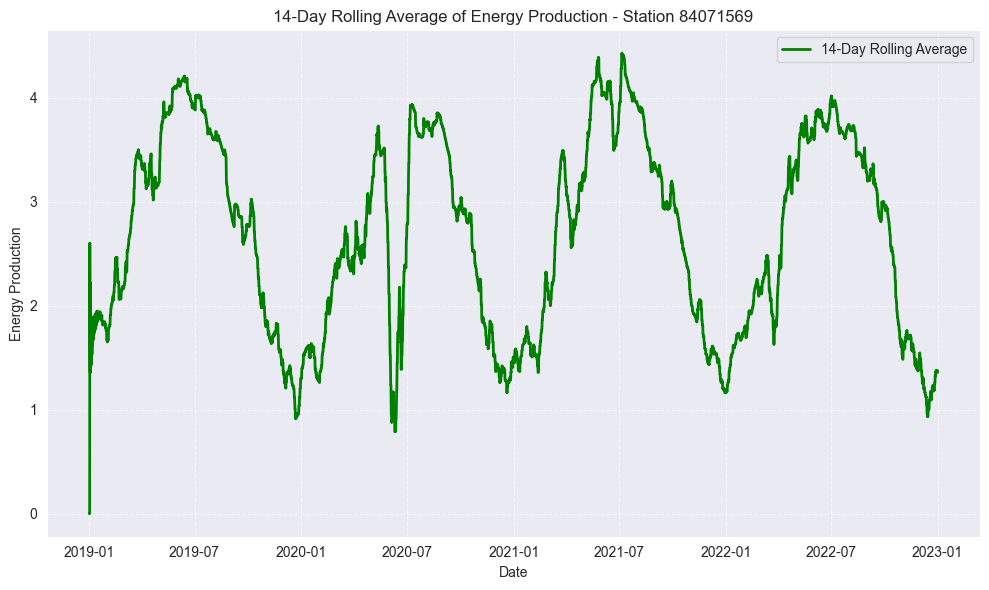

        Date  Produced Energy (kWh)
0 2019-01-01                  80.00
1 2019-01-02                  79.25
2 2019-01-03                  69.00
3 2019-01-04                  43.25
4 2019-01-05                  81.50


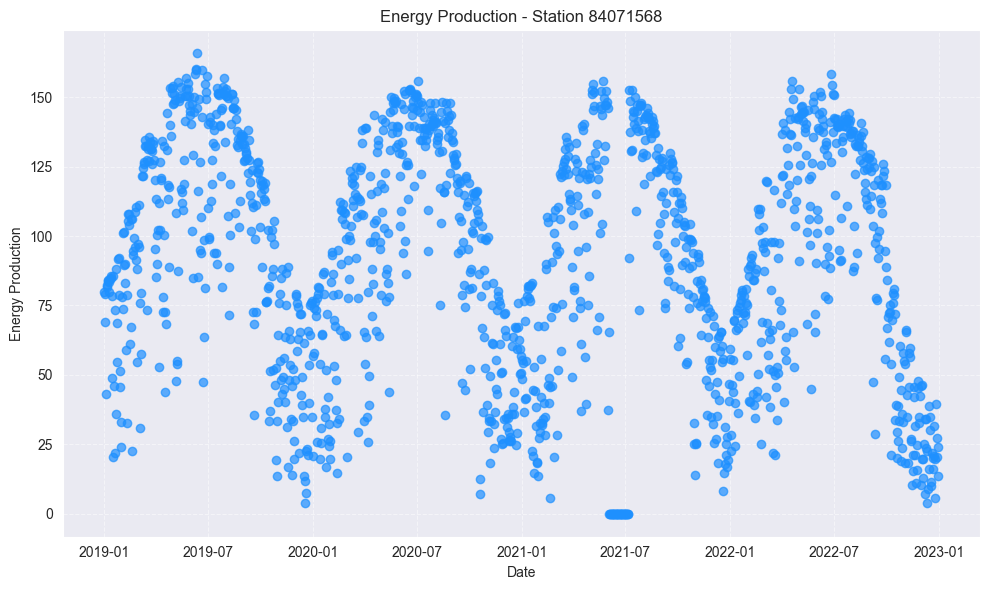

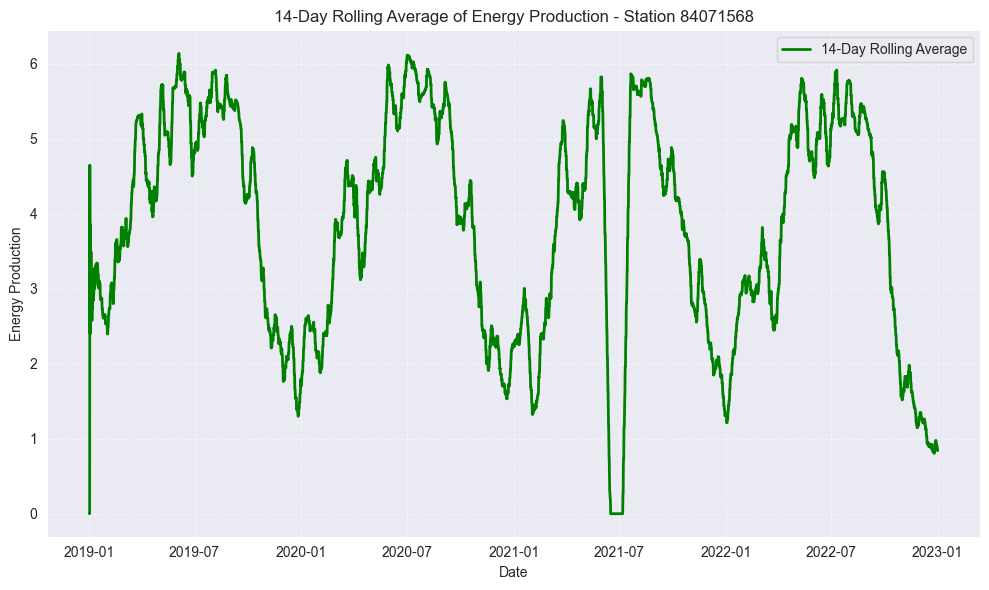

        Date  Produced Energy (kWh)
0 2019-01-01                 110.75
1 2019-01-02                  90.50
2 2019-01-03                  79.50
3 2019-01-04                  59.00
4 2019-01-05                 112.75


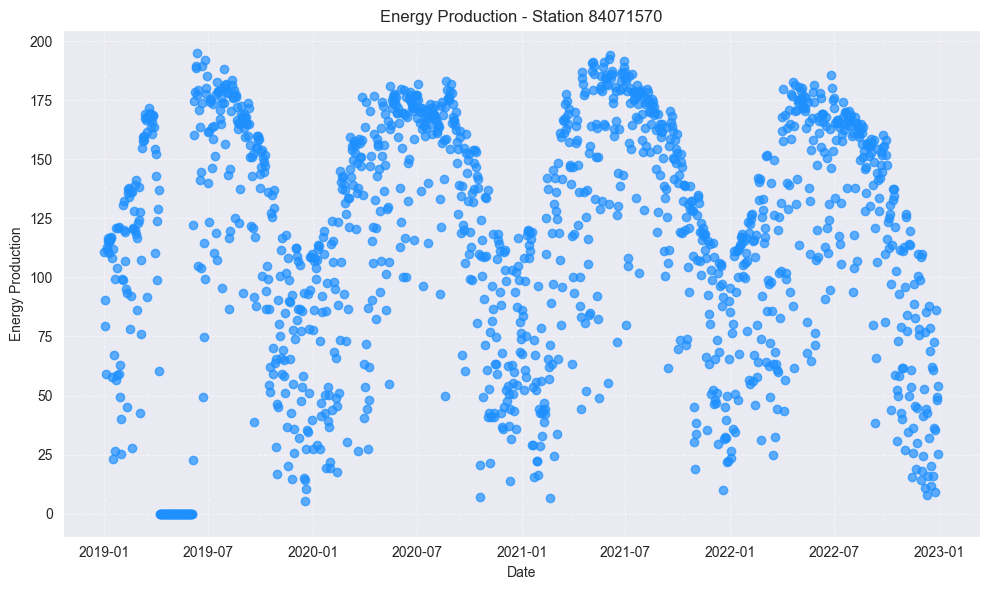

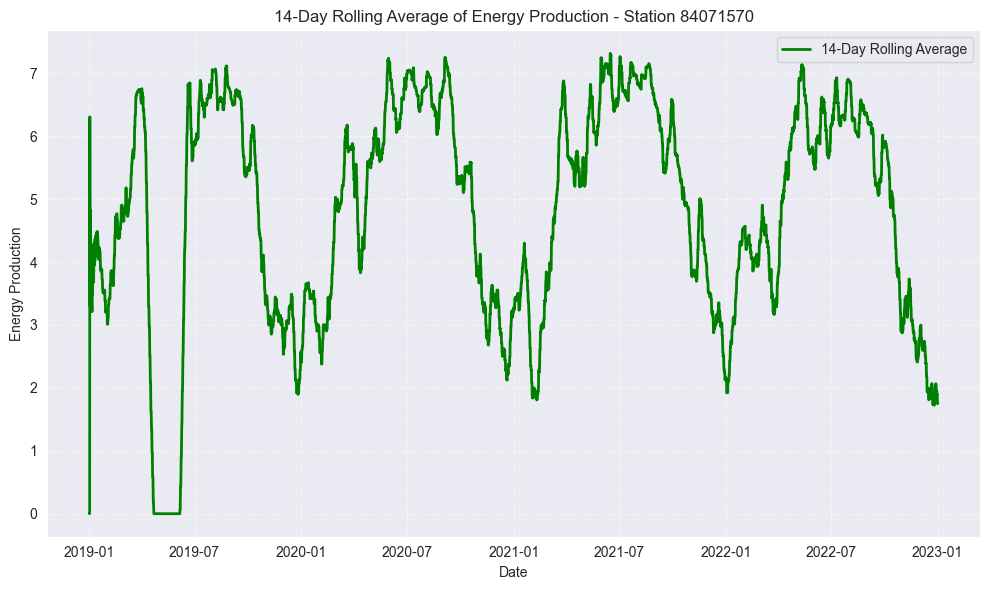

        Date  Produced Energy (kWh)
0 2019-01-01               25.67550
1 2019-01-02               25.74375
2 2019-01-03               13.64050
3 2019-01-04               19.02250
4 2019-01-05               26.38375


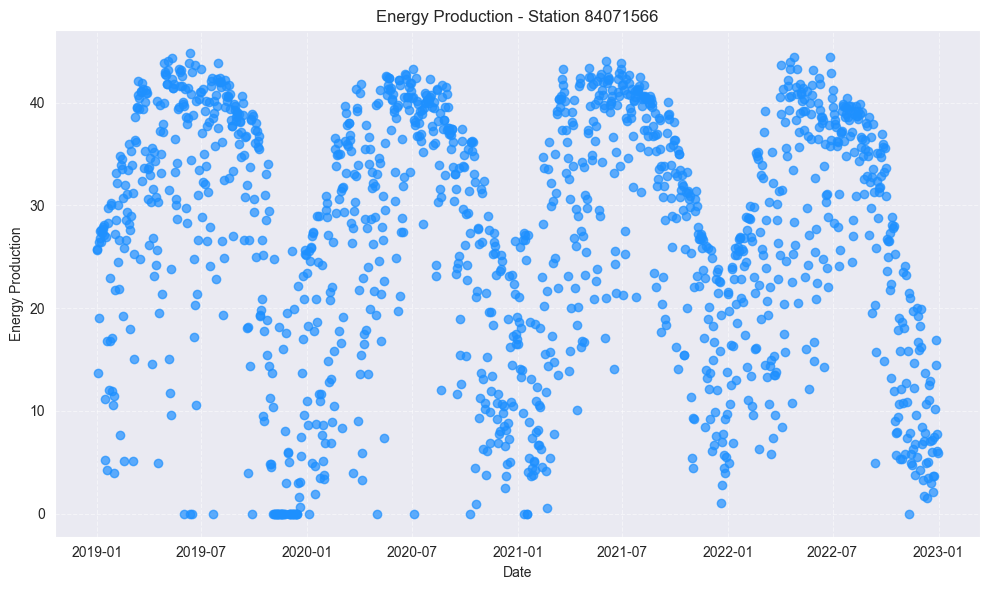

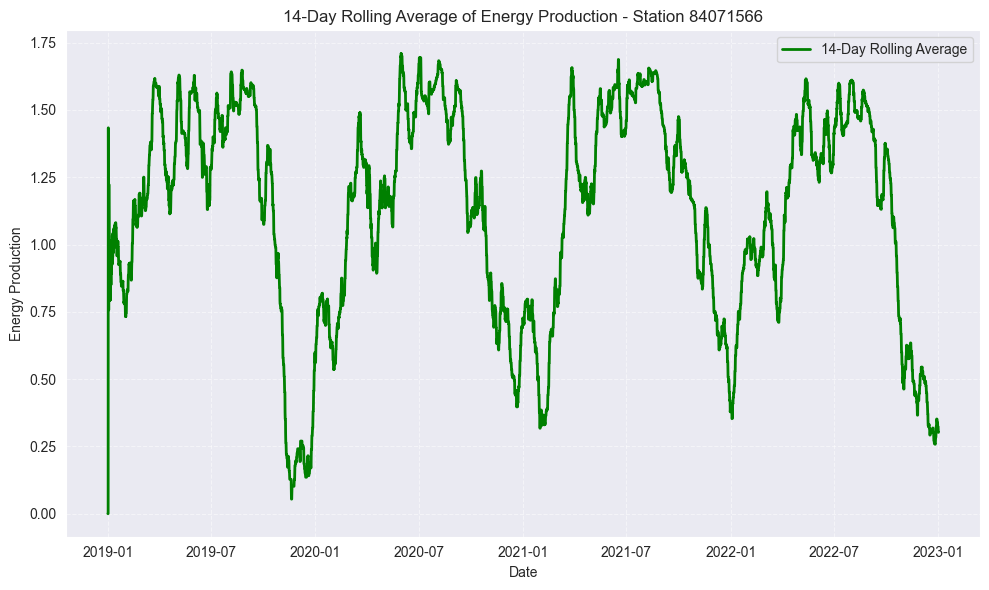

        Date  Produced Energy (kWh)
0 2019-01-01                 111.75
1 2019-01-02                 114.00
2 2019-01-03                 114.00
3 2019-01-04                 106.50
4 2019-01-05                 120.00


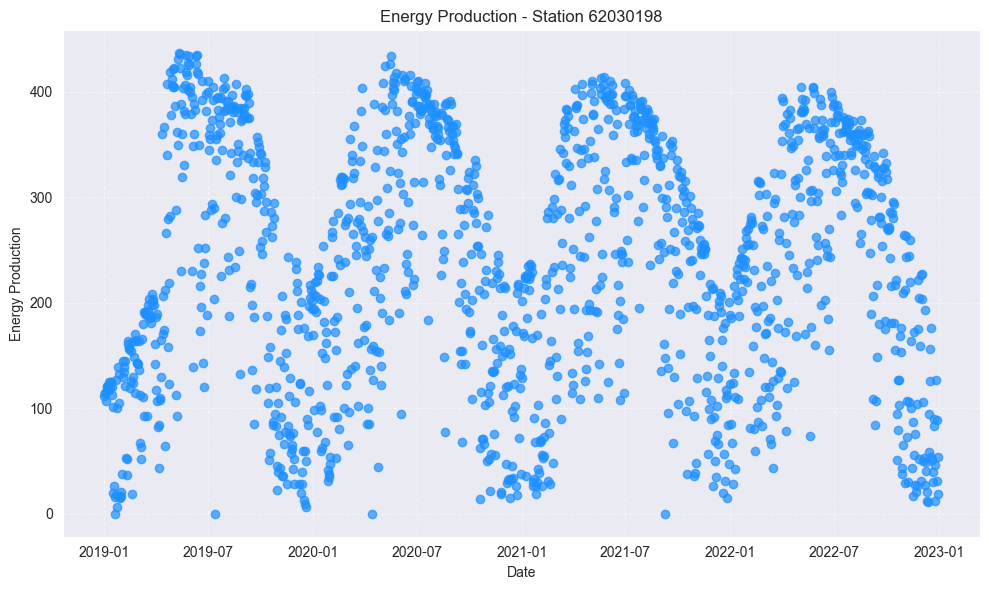

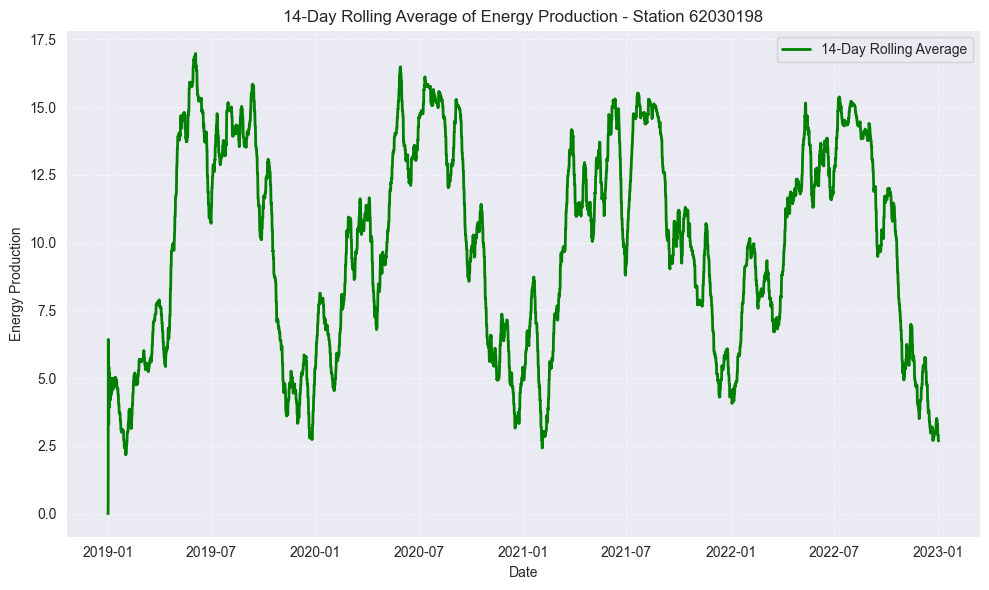

        Date  Produced Energy (kWh)
0 2019-01-01                  94.75
1 2019-01-02                  96.75
2 2019-01-03                  97.25
3 2019-01-04                  93.25
4 2019-01-05                 103.00


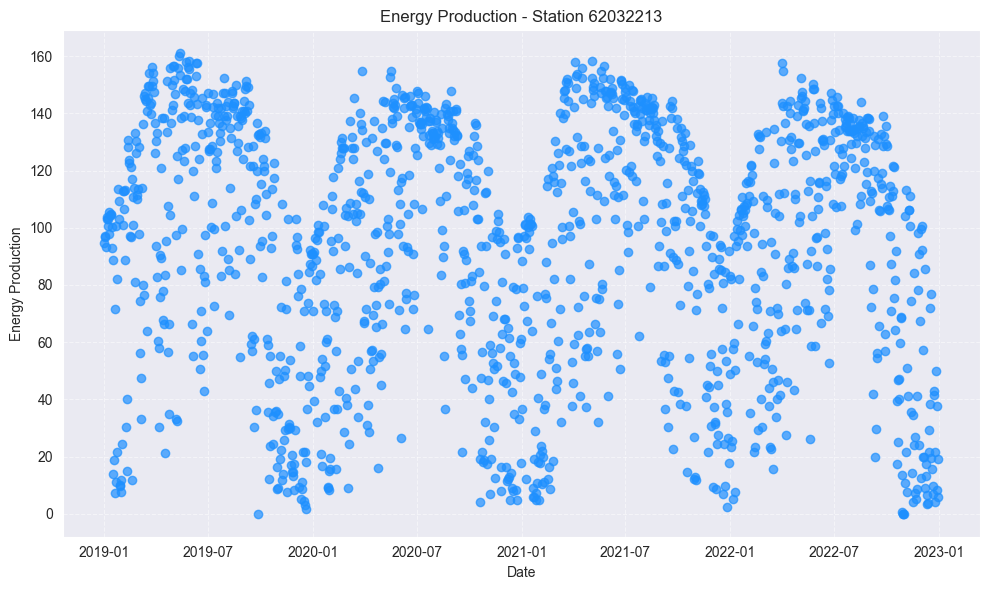

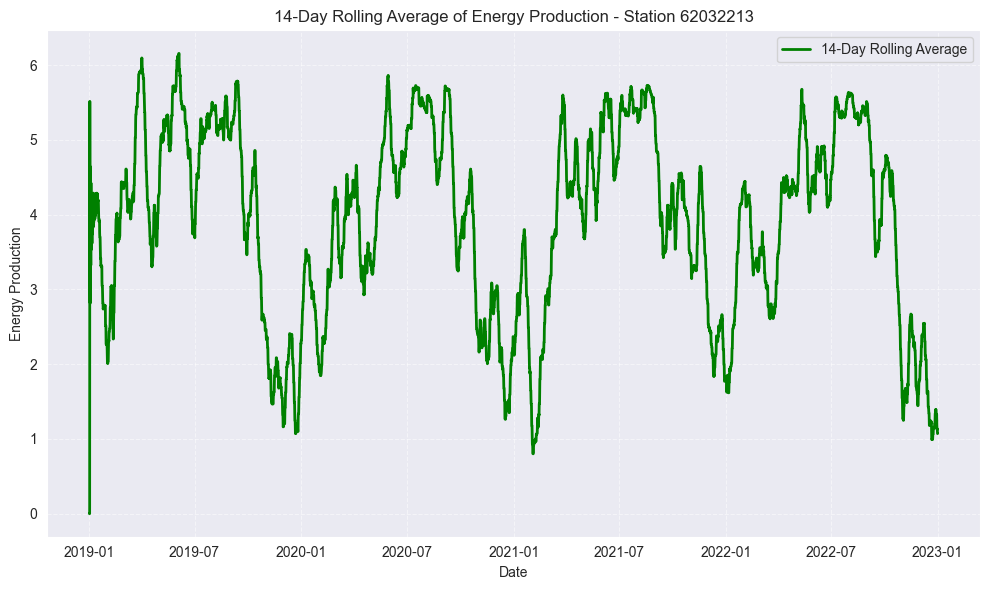

        Date  Produced Energy (kWh)
0 2019-01-01              201.31950
1 2019-01-02              202.27425
2 2019-01-03               91.88000
3 2019-01-04              197.67550
4 2019-01-05              205.94225


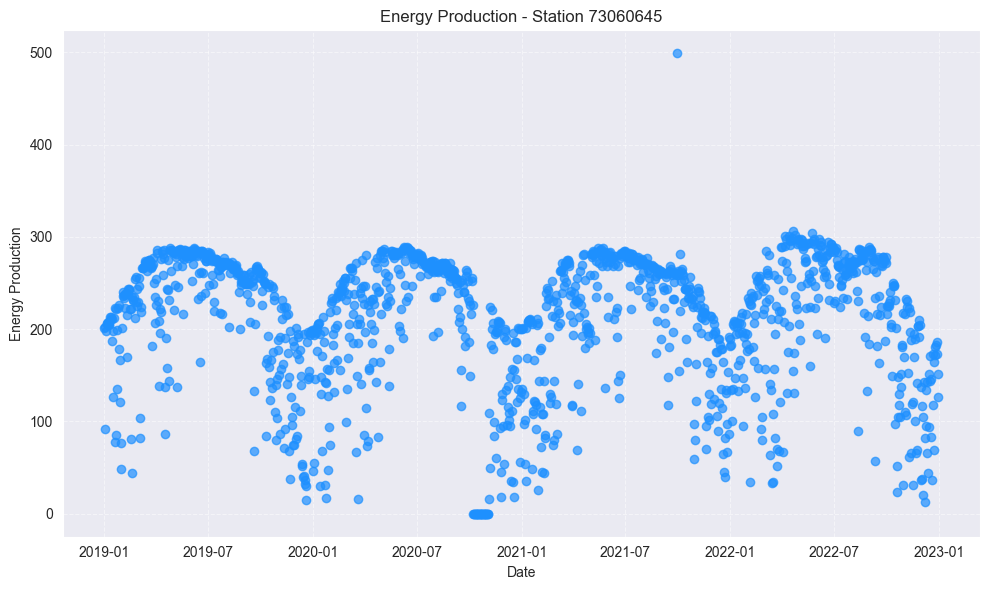

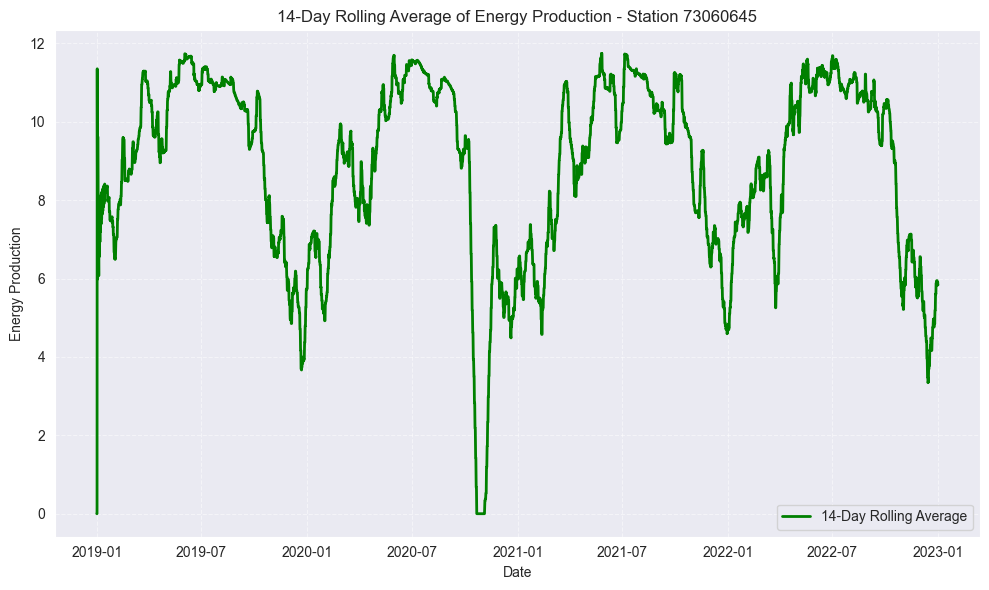

        Date  Produced Energy (kWh)
0 2019-01-01              196.78075
1 2019-01-02              200.24450
2 2019-01-03              154.46650
3 2019-01-04              197.60775
4 2019-01-05              202.46750


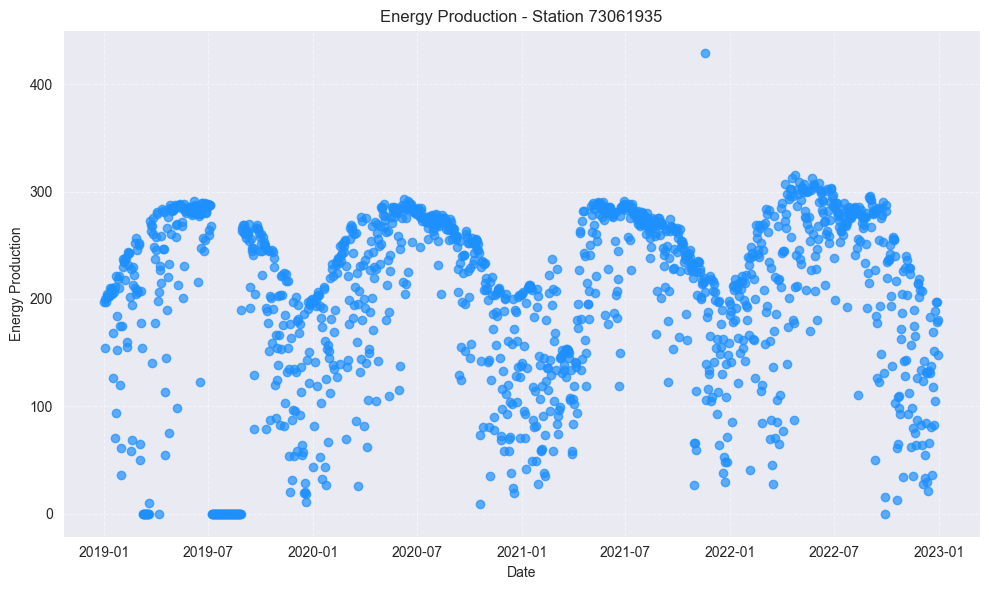

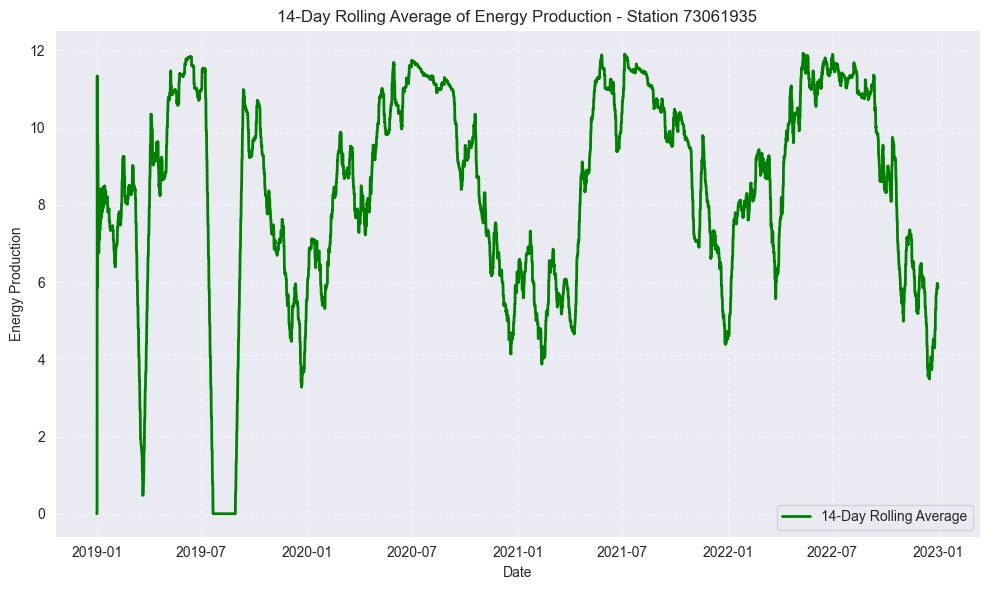

In [15]:
portugal_df["Date"] = pd.to_datetime(portugal_df["Date"])
portugal_df["serial"] = portugal_df["serial"].astype(str)
for _, row in portugal_metadata.iterrows():
    serial = row["PV Serial Number"]
    plot_station_availability(portugal_df, str(serial), ss_id_col='serial', datetime_col='Date', energy_production_col='Produced Energy (kWh)')
    

In [16]:
def plot_monthly_yearly_production(
        df, 
        datetime_col, 
        energy_production_col, 
        powerplant_id_col, 
        metadata_id_col,
        metadata_capacity_col,
        metadata_df,
        selected_powerplants=None,
):
    """
    Function to calculate and plot monthly and yearly energy production for all power plants.

    Parameters:
    df : pd.DataFrame - The DataFrame containing power plant data.
    datetime_col : str - The name of the column containing datetime values.
    energy_production_col : str - The name of the column containing energy production values.
    powerplant_id_col : str - The name of the column containing power plant IDs.

    Returns:
    monthly_production : pd.DataFrame - Monthly energy production for all power plants.
    yearly_production : pd.DataFrame - Yearly energy production for all power plants.
    """
    # Create a copy of the input DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Ensure datetime column is in datetime format
    df_copy[datetime_col] = pd.to_datetime(df_copy[datetime_col], errors='coerce')
    df_copy = df_copy.dropna(subset=[datetime_col])  # Remove rows with NaT
    
    if selected_powerplants is not None:
        df_copy = df_copy[df_copy[powerplant_id_col].isin(selected_powerplants)]
    
    # Merge metadata to include capacity information
    merged_df = pd.merge(df_copy, metadata_df[[metadata_id_col, metadata_capacity_col]], 
                         left_on=powerplant_id_col, right_on=metadata_id_col, how='left')

    # --- Step 2: Group and Resample ---
    merged_df.set_index(datetime_col, inplace=True)
    monthly_production = merged_df.groupby([pd.Grouper(freq='ME'), powerplant_id_col])[energy_production_col].sum().reset_index()
    monthly_production['month'] = monthly_production[datetime_col].dt.strftime('%Y-%m')
    monthly_pivot = monthly_production.pivot(index='month', columns=powerplant_id_col, values=energy_production_col)

    yearly_production = merged_df.groupby([pd.Grouper(freq='YE'), powerplant_id_col])[energy_production_col].sum().reset_index()
    yearly_production['year'] = yearly_production[datetime_col].dt.year
    yearly_pivot = yearly_production.pivot(index='year', columns=powerplant_id_col, values=energy_production_col)

    # --- Step 3: Create Custom Legend Labels ---
    labels = {row[metadata_id_col]: f"ID: {row[metadata_id_col]}, Capacity: {row[metadata_capacity_col]} kWp"
              for _, row in metadata_df.iterrows()}

    for missing_id in monthly_pivot.columns:
        if missing_id not in labels:
            labels[missing_id] = f"ID: {missing_id}, Capacity: Unknown"

    # --- Plot Monthly Energy Production ---
    ax1 = monthly_pivot.plot(kind='bar', figsize=(12, 6), legend=False, alpha=0.8)
    plt.title("Monthly Energy Production for Selected Power Plants")
    plt.xlabel("Month")
    plt.ylabel("Energy Production (Wh)")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Custom Legend for Monthly Plot (underneath the chart)
    handles, _ = ax1.get_legend_handles_labels()
    plt.legend(handles, [labels[col] for col in monthly_pivot.columns], title='Power Plant Info', loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize='small', ncol=3)
    plt.subplots_adjust(bottom=0.6)  # Increase bottom margin
    plt.tight_layout()
    plt.show()

    # --- Plot Yearly Energy Production ---
    ax2 = yearly_pivot.plot(kind='bar', figsize=(10, 6), legend=False, alpha=0.8)
    plt.title("Yearly Energy Production for Selected Power Plants")
    plt.xlabel("Year")
    plt.ylabel("Energy Production (Wh)")
    plt.xticks(rotation=0)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Custom Legend for Yearly Plot (underneath the chart)
    handles, _ = ax2.get_legend_handles_labels()
    plt.legend(handles, [labels[col] for col in yearly_pivot.columns], title='Power Plant Info', loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize='small', ncol=3)
    plt.tight_layout()
    plt.show()

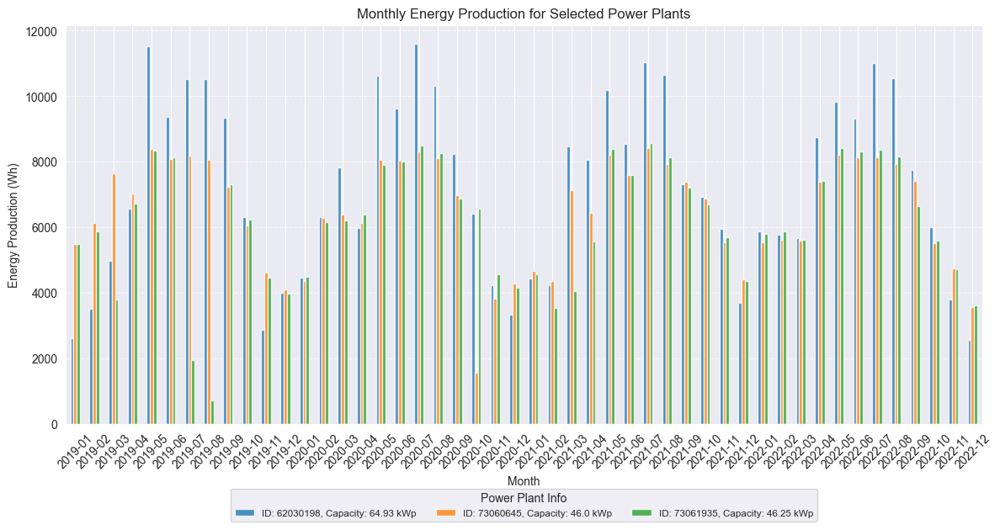

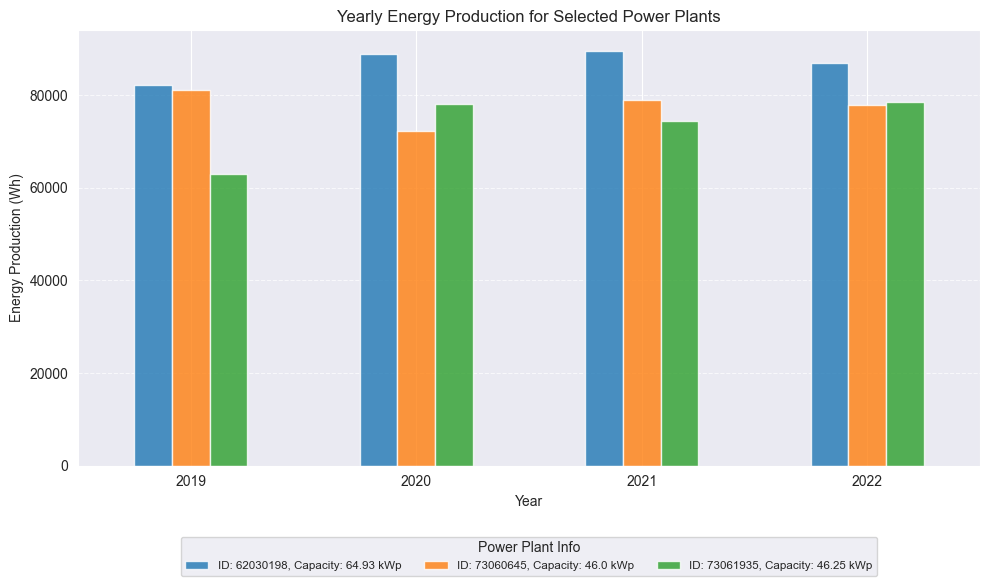

In [17]:
portugal_metadata["PV Serial Number"] = portugal_metadata["PV Serial Number"].astype(str)
portugal_df["serial"] = portugal_df["serial"].astype(str)

plot_monthly_yearly_production(df=portugal_df, datetime_col='Date', energy_production_col='Produced Energy (kWh)', powerplant_id_col='serial', metadata_df=portugal_metadata, metadata_id_col="PV Serial Number", metadata_capacity_col="Installed Power (kWp)", selected_powerplants=['62030198', '73060645', '73061935'])